## 🌐 Connect Colab to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/AI

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/AI


In [ ]:
!pip install keras-cv

In [ ]:
# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(42)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
from tensorflow import keras as keras


# Set seeds for random number generators in NumPy, Python and Tensor Flow
seed=42
np.random.seed(42)
tf.random.set_seed(42);
tf.compat.v1.set_random_seed(42);

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from PIL import Image
import matplotlib.gridspec as gridspec
import cv2
import keras_cv
from sklearn.utils.class_weight import compute_class_weight
#import nrrd # to open our images
#from cleanvision import Imagelab

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.18.0


## ⏳ Load the Data

In [ ]:
full_slice_clean= np.load('/content/drive/MyDrive/AI/full_slice_dataset_clean.npy')
tumor_class_clean = np.load('/content/drive/MyDrive/AI/tumor_class_clean.npy')

print(f"number of full_slice images: {len(full_slice_clean)}")
print(f"number of full_slice labels: {len(tumor_class_clean)}")

number of full_slice images: 2329
number of full_slice labels: 2329


## 🔧 Prepare dataset

In [ ]:
# TRAIN - TEST SPLIT FULL_SLICES
# Split the data into training and validation sets (80% train, 20% val/test)
X_train_full, X_val_full, y_train_full, y_val_full = train_test_split(full_slice_clean, tumor_class_clean, test_size=0.2, random_state=42, stratify=tumor_class_clean)

# Print the shapes of the loaded datasets
print("Training Data Shape:", X_train_full.shape)
print("Training Label Shape:", y_train_full.shape)
print("validation Data Shape:", X_val_full.shape)
print("validation Label Shape:", y_val_full.shape)

Training Data Shape: (1863, 512, 512)
Training Label Shape: (1863,)
validation Data Shape: (466, 512, 512)
validation Label Shape: (466,)


In [ ]:
#From list to tensor
X_train_full = np.asarray(X_train_full)
y_train_full = np.asarray(y_train_full)
X_val_full = np.asarray(X_val_full)
y_val_full = np.asarray(y_val_full)

print(X_train_full.shape)
print(y_train_full.shape)

(1863, 512, 512)
(1863,)


In [ ]:
# add the extra dimension for the color
X_train_full = np.expand_dims(X_train_full, axis=-1)  # add an extra channel in X_train
X_val_full = np.expand_dims(X_val_full, axis=-1)  # same for X_val

print("full_slices:")
print(f"X_train: {X_train_full.shape}")
print(f"y_train: {y_train_full.shape}")
print(f"X_val: {X_val_full.shape}")
print(f"y_val: {y_val_full.shape}")
print("\n")


full_slices:
X_train: (1863, 512, 512, 1)
y_train: (1863,)
X_val: (466, 512, 512, 1)
y_val: (466,)




In [ ]:
# check the type
print(X_train_full.dtype)
print(y_train_full.dtype)
# i will transform everything into float32 because this format is better to be fed into the network

# trasform in tf.float32
X_train_full = X_train_full.astype(np.float32)
y_train_full = y_train_full.astype(np.float32)
X_val_full = X_val_full.astype(np.float32)
y_val_full = y_val_full.astype(np.float32)

int16
int64


## 🔄 Process Data:

1. Clip Hu pixel values into -1000, 400

Valore dei pixel da -32768.0 a -31458.380859375: 12 occorrenze
Valore dei pixel da -31458.380859375 a -30148.759765625: 0 occorrenze
Valore dei pixel da -30148.759765625 a -28839.140625: 0 occorrenze
Valore dei pixel da -28839.140625 a -27529.51953125: 0 occorrenze
Valore dei pixel da -27529.51953125 a -26219.900390625: 0 occorrenze
Valore dei pixel da -26219.900390625 a -24910.279296875: 0 occorrenze
Valore dei pixel da -24910.279296875 a -23600.66015625: 0 occorrenze
Valore dei pixel da -23600.66015625 a -22291.0390625: 0 occorrenze
Valore dei pixel da -22291.0390625 a -20981.419921875: 3 occorrenze
Valore dei pixel da -20981.419921875 a -19671.80078125: 1 occorrenze
Valore dei pixel da -19671.80078125 a -18362.1796875: 0 occorrenze
Valore dei pixel da -18362.1796875 a -17052.560546875: 0 occorrenze
Valore dei pixel da -17052.560546875 a -15742.9404296875: 0 occorrenze
Valore dei pixel da -15742.9404296875 a -14433.3203125: 0 occorrenze
Valore dei pixel da -14433.3203125 a -13123.700

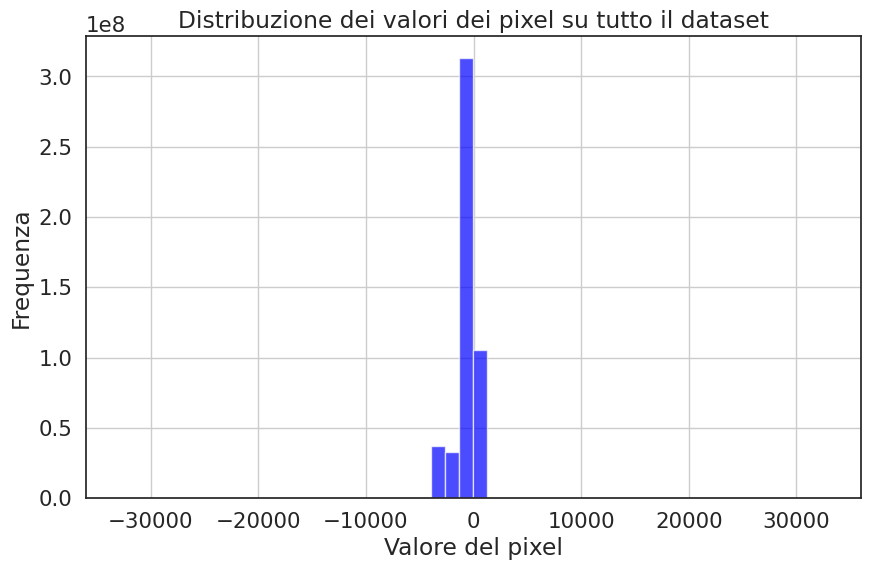

In [ ]:
#FULL SLICE
all_pixels = X_train_full.flatten()  # flatten in a 1D array

# perform the pixel distribution using np.histogram
frequenze, bin_edges = np.histogram(all_pixels, bins=50)

# print the results
for i in range(len(frequenze)):
    print(f"Valore dei pixel da {bin_edges[i]} a {bin_edges[i+1]}: {frequenze[i]} occorrenze")

# show (histogram)
plt.figure(figsize=(10,6))
plt.hist(all_pixels, bins=50, color='blue', alpha=0.7)
plt.title('Distribuzione dei valori dei pixel su tutto il dataset')
plt.xlabel('Valore del pixel')
plt.ylabel('Frequenza')
plt.grid(True)
plt.show()

# as we can see the pixel are concentrated in a small interval and only few data are outside this interval.
# I clip the value

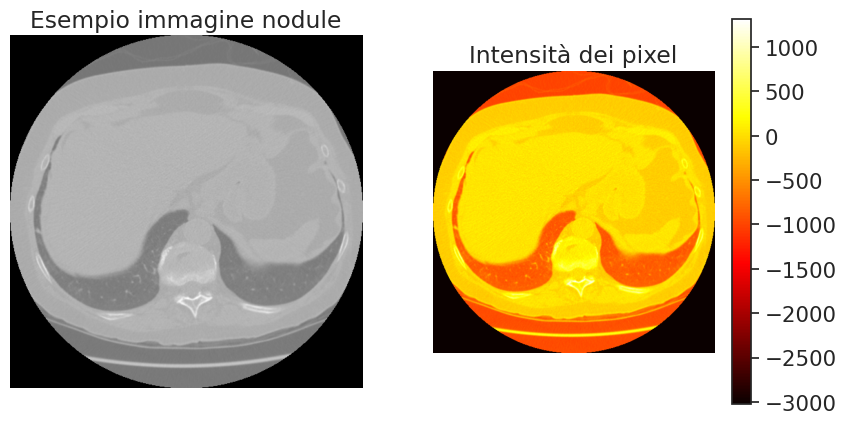

In [ ]:
# just for a visual understanding

def show_image_with_intensity(image, title="Image"):
    plt.figure(figsize=(10, 5))

    # original image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')

    # image with heatmap
    plt.subplot(1, 2, 2)
    plt.imshow(image, cmap='hot')
    plt.title('Intensità dei pixel')
    plt.colorbar()
    plt.axis('off')

    plt.show()

# show
show_image_with_intensity(X_train_full[8], title="Esempio immagine nodule")


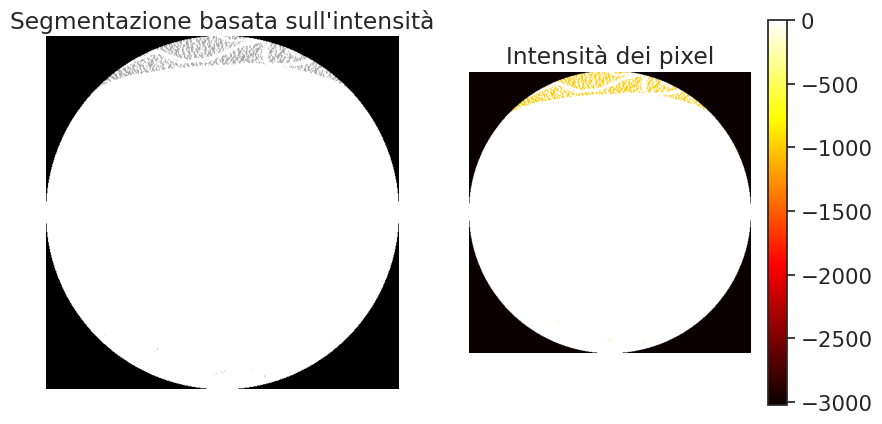

In [ ]:
def segment_by_intensity(image, low_threshold, high_threshold):
# create a mask to show only pixels between the 2 thr. (low and high)
    mask = (image > low_threshold) & (image < high_threshold)

    segmented_image = np.zeros_like(image)
    segmented_image[mask] = image[mask]

    return segmented_image

# Segment the image
segmented_full = segment_by_intensity(X_train_full[8], -30000, -1000)

# show
show_image_with_intensity(segmented_full, title="Segmentazione basata sull'intensità")


Valore dei pixel da -1000.0 a -972.0: 155860315 occorrenze
Valore dei pixel da -972.0 a -944.0: 21868973 occorrenze
Valore dei pixel da -944.0 a -916.0: 22032526 occorrenze
Valore dei pixel da -916.0 a -888.0: 23206318 occorrenze
Valore dei pixel da -888.0 a -860.0: 18488923 occorrenze
Valore dei pixel da -860.0 a -832.0: 14326329 occorrenze
Valore dei pixel da -832.0 a -804.0: 10421261 occorrenze
Valore dei pixel da -804.0 a -776.0: 7255262 occorrenze
Valore dei pixel da -776.0 a -748.0: 5038695 occorrenze
Valore dei pixel da -748.0 a -720.0: 3619018 occorrenze
Valore dei pixel da -720.0 a -692.0: 2725659 occorrenze
Valore dei pixel da -692.0 a -664.0: 2156835 occorrenze
Valore dei pixel da -664.0 a -636.0: 1776455 occorrenze
Valore dei pixel da -636.0 a -608.0: 1506806 occorrenze
Valore dei pixel da -608.0 a -580.0: 1313914 occorrenze
Valore dei pixel da -580.0 a -552.0: 1174762 occorrenze
Valore dei pixel da -552.0 a -524.0: 1074896 occorrenze
Valore dei pixel da -524.0 a -496.0: 10

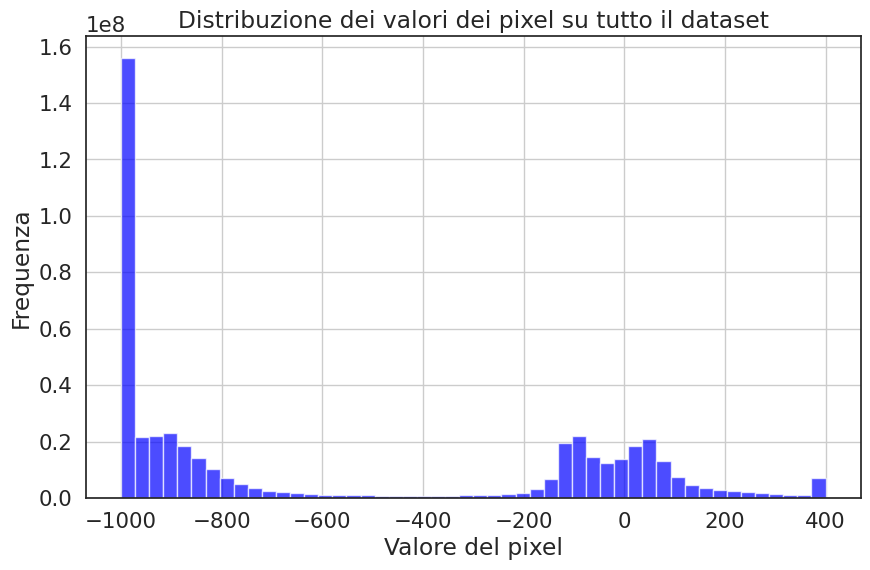

In [ ]:
# clipping
lower_bound = -1000
upper_bound = 400

X_train_full = np.clip(X_train_full, lower_bound, upper_bound)
X_val_full = np.clip(X_val_full, lower_bound, upper_bound)

# Vizualization
all_pixels = X_train_full.flatten()  # Appiattisce tutte le immagini in un array 1D

# pixel distribution
frequenze, bin_edges = np.histogram(all_pixels, bins=50)

# print
for i in range(len(frequenze)):
    print(f"Valore dei pixel da {bin_edges[i]} a {bin_edges[i+1]}: {frequenze[i]} occorrenze")


# show
plt.figure(figsize=(10,6))
plt.hist(all_pixels, bins=50, color='blue', alpha=0.7)
plt.title('Distribuzione dei valori dei pixel su tutto il dataset')
plt.xlabel('Valore del pixel')
plt.ylabel('Frequenza')
plt.grid(True)
plt.show()


2. CLAHE

Preprocessing completato con CLAHE su X_train_full!


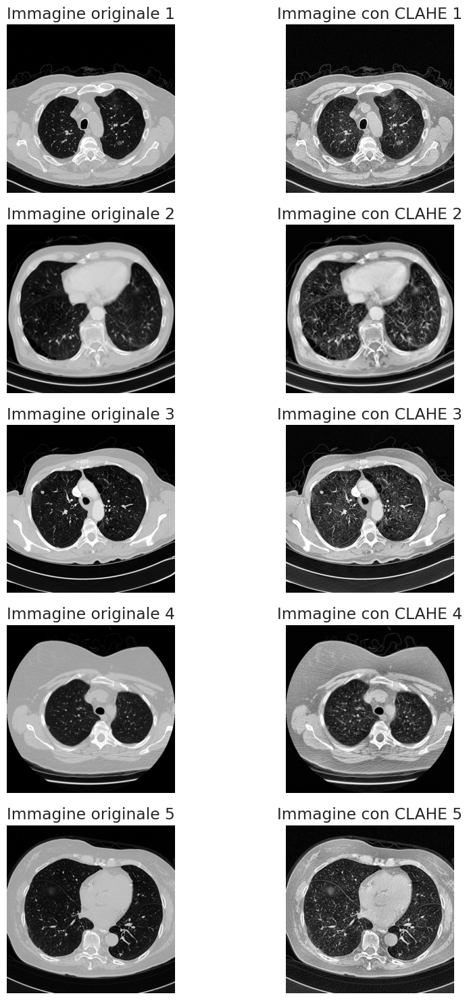

In [ ]:
# CLAHE
def apply_clahe(image):
    if image.dtype != np.uint8:
        image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

# Apply clahe
X_train_full_clahe = np.array([apply_clahe(img) for img in X_train_full])
X_val_full_clahe = np.array([apply_clahe(img) for img in X_val_full])

print("Preprocessing completato con CLAHE su X_train_full!")

# take 5 random images
n_images = 5
random_indices = np.random.choice(len(X_train_full), n_images, replace=False)
sample_images = [X_train_full[i] for i in random_indices]
sample_images_clahe = [X_train_full_clahe[i] for i in random_indices]


# visualize images before and after
fig, axes = plt.subplots(n_images, 2, figsize=(10, 15))

for i in range(n_images):
    # original image
    axes[i, 0].imshow(sample_images[i], cmap='gray')
    axes[i, 0].set_title(f"Immagine originale {i+1}")
    axes[i, 0].axis('off')

    # CLAHE image
    axes[i, 1].imshow(sample_images_clahe[i], cmap='gray')
    axes[i, 1].set_title(f"Immagine con CLAHE {i+1}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

X_train_full=X_train_full_clahe
X_val_full=X_val_full_clahe

3. Denoising

Preprocessing completato con denoising su X_train_full!


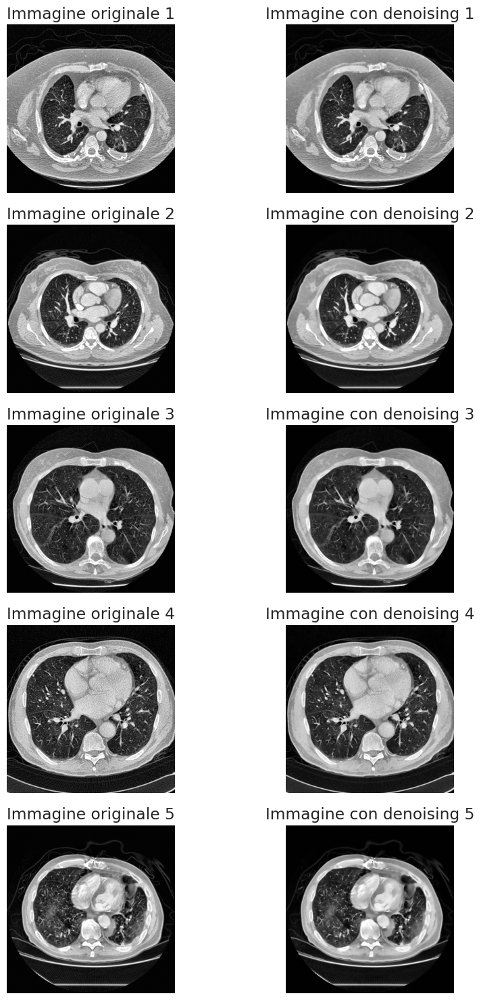

In [ ]:

def denoise_image(image):
    # Filtro bilaterale per denoising
    return cv2.bilateralFilter(image, d=9, sigmaColor=20, sigmaSpace=20)


batch_size = 100  # denoising of 100 at once
X_train_full_den = []
X_val_full_den = []
for i in range(0, len(X_train_full), batch_size):
    batch = X_train_full[i:i+batch_size]
    denoised_batch = [denoise_image(img) for img in batch]
    X_train_full_den.extend(denoised_batch)
X_train_full_den = np.array(X_train_full_den)

for i in range(0, len(X_val_full), batch_size):
    batch = X_val_full[i:i+batch_size]
    denoised_batch = [denoise_image(img) for img in batch]
    X_val_full_den.extend(denoised_batch)
X_val_full_den = np.array(X_val_full_den)
print("Preprocessing completato con denoising su X_train_full!")

# take 5 images
n_images = 5
random_indices = np.random.choice(len(X_train_full), n_images, replace=False)
sample_images_full = [X_train_full[i] for i in random_indices]
sample_images_full_den = [X_train_full_den[i] for i in random_indices]

# visualize before and after
fig, axes = plt.subplots(n_images, 2, figsize=(10, 15))

for i in range(n_images):

    # Immagine originale full
    axes[i, 0].imshow(sample_images_full[i], cmap='gray')
    axes[i, 0].set_title(f"Immagine originale {i+1}")
    axes[i, 0].axis('off')

    # Immagine con CLAHE
    axes[i, 1].imshow(sample_images_full_den[i], cmap='gray')
    axes[i, 1].set_title(f"Immagine con denoising {i+1}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

X_train_full=X_train_full_den
X_val_full=X_val_full_den


4. Normalization

In [ ]:
# min and max pixel values
min_full = np.min(X_train_full)
max_full = np.max(X_train_full)

print(f"max di full: {max_full}")
print(f"min di full: {min_full}")

max di full: 255
min di full: 1


In [ ]:
# normalize btw [0,1]
X_train_full = ((X_train_full - min_full) / (max_full - min_full)) #*255
X_val_full = ((X_val_full - min_full) / (max_full - min_full)) #*255


# to check
min_full = np.min(X_train_full)
max_full = np.max(X_train_full)
print(f"max di full: {max_full}")
print(f"min di full: {min_full}")

max di full: 1.0
min di full: 0.0


In [ ]:
# put the pixel values around zero
# mean
full_mean_pixel = np.mean(X_train_full)

X_train_full = X_train_full - full_mean_pixel
X_val_full = X_val_full - full_mean_pixel

# just to check
min_full = np.min(X_train_full)
max_full = np.max(X_train_full)
print(f"max di full: {max_full}")
print(f"min di full: {min_full}")
#print(f"max di nodule: {max_nodule}")
#print(f"min di nodule: {min_nodule}")


max di full: 0.6792730543330188
min di full: -0.3207269456669812
max di nodule: 0.6363572775217097
min di nodule: -0.36364272247829027


class distribution and class weights

In [ ]:
#1. binary classes

# Convert labels to binary
# (are already btw 0 and 4 => 0,1,2 benign ; 3-4 malign
y_train_full_bin = np.where(y_train_full < 3, 0, 1)
y_val_full_bin = np.where(y_val_full <3, 0, 1)

number of samples for each class: 
{0: 1381, 1: 439}


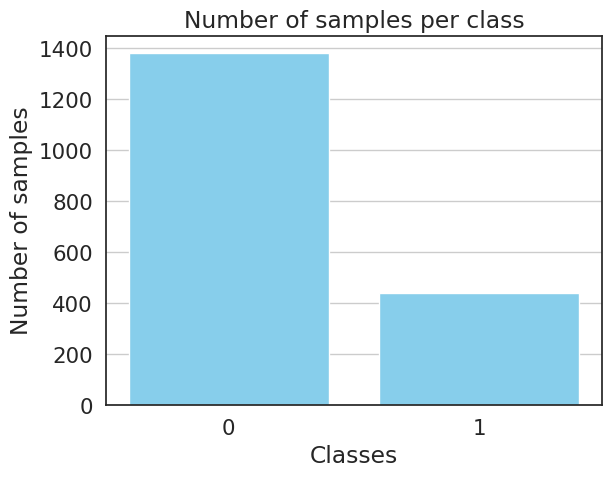

class weights nodule: {0: 0.6589427950760318, 1: 2.072892938496583}


In [ ]:
# Binary distribution and class weights
unique, counts = np.unique(y_train_full_bin, return_counts=True)
print("number of samples for each class: ")
print(dict(zip(unique, counts)))

# show
plt.bar(unique, counts, color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Number of samples')
plt.title('Number of samples per class')
plt.xticks(unique)
plt.grid(axis='y')
plt.show()

# CLASS WEIGHTS
weights_full_bin = compute_class_weight('balanced', classes=np.unique(y_train_full_bin), y=y_train_full_bin)
weights_full_bin = dict(enumerate(weights_full_bin))
print("class weights nodule:", weights_full_bin)

number of samples for each class: 
{1.0: 188, 2.0: 355, 3.0: 838, 4.0: 321, 5.0: 118}


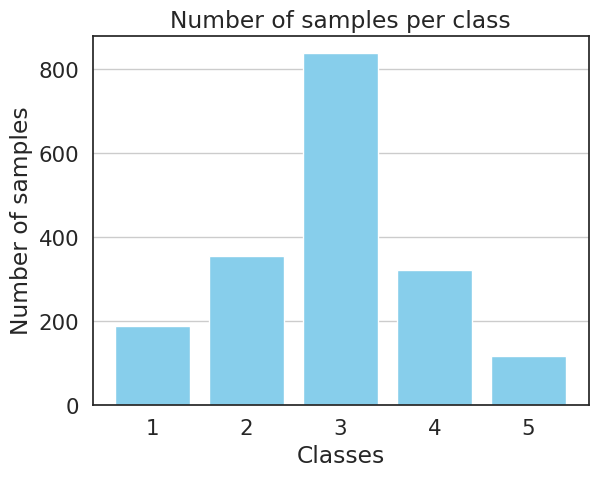

class weights full: {0: 1.9361702127659575, 1: 1.0253521126760563, 2: 0.4343675417661098, 3: 1.1339563862928348, 4: 3.0847457627118646}


In [ ]:
# 2. 5 classes

unique, counts = np.unique(y_train_full, return_counts=True)
print("number of samples for each class: ")
print(dict(zip(unique, counts)))

# show
plt.bar(unique, counts, color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Number of samples')
plt.title('Number of samples per class')
plt.xticks(unique)
plt.grid(axis='y')
plt.show()

# CLASS WEIGHTS
class_weights_full = compute_class_weight('balanced', classes=np.unique(y_train_full), y=y_train_full)
class_weights_full = dict(enumerate(class_weights_full))
print("class weights full:", class_weights_full)


one-hot encoding

In [ ]:
# Convert labels to categorical format using one-hot encoding
# in one-hot the index start from 0 => i have to convert into from 0 to 4 in order to have 5 classes
y_train_full = tfk.utils.to_categorical(y_train_full - 1)
y_val_full = tfk.utils.to_categorical(y_val_full - 1)
y_train_nodule = tfk.utils.to_categorical(y_train_nodule - 1)
y_val_nodule = tfk.utils.to_categorical(y_val_nodule - 1)

print(y_val_full.shape)
# ok, 5 classes (0-4 which corrispond to the real classes 1-5) => at the end I have to make +1 to the predictions

(456, 5)


## 🎨 Augmentation

In [ ]:
from tensorflow import keras
augmentation= keras.Sequential([
    # trasformazioni geometriche
    #keras_cv.layers.RandAugment(value_range=(0, 1), augmentations_per_image=3), # applica ≠ trasformazioni casualmente (scalamento, rotazioni, ...)
    tfkl.RandomFlip("horizontal and vertical", seed=seed),  # Ribaltamenti solo orizzontali (verticale non ha senso)
    #tfkl.RandomTranslation(0.3, 0.3, fill_mode='wrap', seed=seed),  # Maggiore traslazione
    tfkl.RandomRotation(0.1, fill_mode='reflect', seed=seed),  # Rotazioni
    #tfkl.RandomZoom(height_factor=0.5, width_factor=0.5, fill_mode='nearest', seed=seed),
    #keras_cv.layers.RandomShear(x_factor=0.5, y_factor=0.5),   # distorsioni geometriche (immagini inclinate),
    #tfkl.RandomCrop(height=56, width=56),
    #tfkl.Resizing(height=64, width=64),  # Resize back to 64x64

    # tecniche di mescolamento
    #keras_cv.layers.CutMix(), # sostituisce una porzione di immagine con una di un'altra immagine
    #keras_cv.layers.MixUp(),  # somma due imagini in maniera lineare
    #keras_cv.layers.RandomCutout(height_factor=0.2, width_factor=0.2), # non ha senso qui (magari mi oscura il tumore)

    # trasformazioni di colore/canale
    # keras_cv.layers.RandomChannelShift(factor=0.1, value_range=(0, 1)),   # disturbi cromatici
    #keras_cv.layers.RandomSaturation(factor=0.4),    # no for grayscale images
    #tfkl.RandomBrightness(0.2, value_range=(0,1), seed=seed),  # Variazione luminosità ridotta
    #keras_cv.layers.AutoContrast(value_range=(0,1)),
    #keras_cv.layers.RandomSharpness(factor=0.2, value_range=(0, 1)),
], name='augmentation')

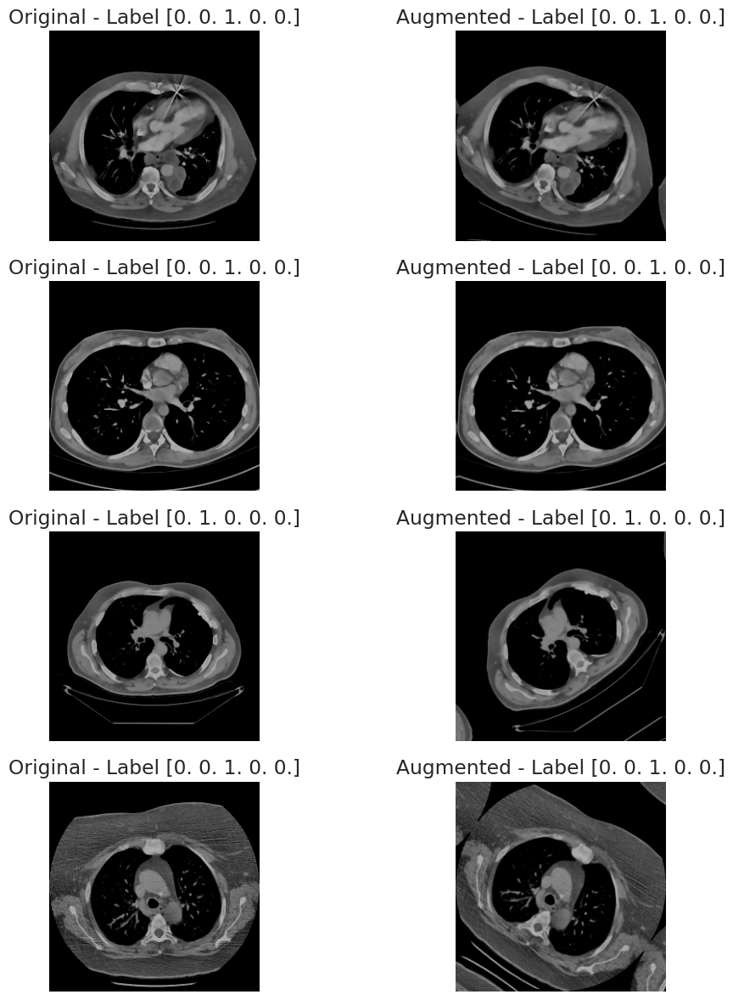

In [ ]:
# Prendi 4 immagini casuali da X_train
sample_images = X_train_full[np.random.choice(X_train_full.shape[0], 4, replace=False)]
sample_labels = y_train_full[np.random.choice(y_train_full.shape[0], 4, replace=False)]

# Crea una figura per visualizzare le immagini
plt.figure(figsize=(12, 12))

# Applica l'augmentation su ciascuna immagine e visualizzale
for i, (image, label) in enumerate(zip(sample_images, sample_labels)):
    # Aggiungi una dimensione batch (aggiungi una dimensione in più per batch)
    image_batch = image[tf.newaxis]

    # Applica l'augmentation
    augmented_image = augmentation(image_batch)  # Restituisce direttamente il tensore aumentato

    # Rimuovi la dimensione batch per visualizzare l'immagine
    augmented_image = augmented_image[0].numpy()

    # Normalizza i valori delle immagini tra 0 e 1 per la visualizzazione
    #image = (image - image.min()) / (image.max() - image.min())
    #augmented_image = (augmented_image - augmented_image.min()) / (augmented_image.max() - augmented_image.min())

    # Visualizza l'immagine originale (a sinistra) e l'immagine aumentata (a destra)
    plt.subplot(4, 2, 2 * i + 1)  # Colonna per le immagini originali
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title(f"Original - Label {label}")

    plt.subplot(4, 2, 2 * i + 2)  # Colonna per le immagini aumentate
    plt.imshow(augmented_image, cmap='gray')
    plt.axis('off')
    plt.title(f"Augmented - Label {label}")

plt.tight_layout()
plt.show()

## 🏗️ Model

In [ ]:
# Input shape for the model
input_shape = (512,512)

# Output shape for the model
output_shape=5

print("Input Shape:", input_shape)
print("Output Shape:", output_shape)

In [ ]:
# set batch size for training
BATCH_SIZE = 16

# set learning rate for the optimiser
LEARNING_RATE = 1e-4

# set early stopping patience threshold
PATIENCE = 25

# set maximum number of training epochs
EPOCHS = 250


In [ ]:
def se_block(x, reduction_ratio=16):
    # Ottieni le dimensioni dell'output
    filters = x.shape[-1]

    # "Squeeze" - ridurre la dimensione spaziale
    se = tfkl.GlobalAveragePooling2D()(x)

    # "Excite" - ridurre la dimensione dei canali
    se = tfkl.Dense(filters // reduction_ratio, activation='relu')(se)
    se = tfkl.Dense(filters, activation='sigmoid')(se)

    # Ridimensiona il vettore di attenzione
    se = tfkl.Reshape((1, 1, filters))(se)

    # Moltiplica il tensore di input per il tensore di attenzione
    x = tfkl.Multiply()([x, se])

    return x


In [ ]:
from keras import layers
def spatial_attention(input_tensor):
    # Calcola la media e la deviazione standard lungo i canali
    avg_pool = layers.GlobalAveragePooling2D()(input_tensor)
    max_pool = layers.GlobalMaxPooling2D()(input_tensor)

    # Concatena la media e la massima pooling lungo l'asse del canale
    concat = layers.Concatenate(axis=-1)([avg_pool, max_pool])

    # Passa attraverso una convoluzione 2D per produrre una mappa di attenzione spaziale
    concat = layers.Reshape((1, 1, concat.shape[-1]))(concat)  # Reshape per fare la convoluzione
    attention_map = layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(concat)

    # Moltiplica l'input per la mappa di attenzione spaziale
    output = layers.Multiply()([input_tensor, attention_map])

    return output

In [ ]:
def cbam(input_tensor, ratio=8):
    # Squeeze-and-Excitation (SE) Block
    se = se_block(input_tensor, ratio)

    # Spatial Attention Block
    sa = spatial_attention(se)

    return sa


In [ ]:
# Residual Block
def res_block(x, filters, kernel_size=3, stride=1):
    # Save the input for the residual connection
    skip = x

    # First convolution
    x = tfkl.Conv2D(filters=filters, kernel_size=kernel_size, kernel_regularizer=regularizers.l2(0.01),strides=stride, padding='same')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.ReLU()(x)

    # Second convolution
    x = tfkl.Conv2D(filters=filters, kernel_size=kernel_size, kernel_regularizer=regularizers.l2(0.01),strides=1, padding='same')(x)
    x = tfkl.BatchNormalization()(x)

    # Allinea i canali di skip con i canali di x (se necessario) usando una convoluzione 1x1
    if skip.shape[-1] != x.shape[-1]:
        skip = tfkl.Conv2D(x.shape[-1], (1, 1), padding='same')(skip)
    # Aggiungi la skip connection
    x = tfkl.add([x, skip])  # Residual connection
    x = tfkl.ReLU()(x)
    return x


In [ ]:
# Aggiungi un asse per il canale
X_train_full = np.expand_dims(X_train_full, axis=-1)  # Diventa 64x64x1
X_val_full = np.expand_dims(X_val_full, axis=-1)      # Diventa 64x64x1

X_train_full=tf.image.resize(X_train_full, (256, 256))
X_val_full=tf.image.resize(X_val_full, (256, 256))

# Ripeti lungo l'asse del canale per portare a 64x64x3
X_train_full = np.repeat(X_train_full, 3, axis=-1)    # Diventa 64x64x3
X_val_full = np.repeat(X_val_full, 3, axis=-1)        # Diventa 64x64x3

In [ ]:
import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, concatenate, BatchNormalization, ReLU

def inception_block(x, filters):
    # Branch 1: 1x1 convolution
    branch_1 = Conv2D(filters, (1, 1), padding='same')(x)
    branch_1 = BatchNormalization()(branch_1)
    branch_1 = ReLU()(branch_1)

    # Branch 2: 1x1 convolution followed by 3x3 convolution
    branch_2 = Conv2D(filters, (1, 1), padding='same')(x)
    branch_2 = BatchNormalization()(branch_2)
    branch_2 = ReLU()(branch_2)
    branch_2 = Conv2D(filters, (3, 3),kernel_regularizer=regularizers.l2(0.01), padding='same')(branch_2)
    branch_2 = BatchNormalization()(branch_2)
    branch_2 = ReLU()(branch_2)

    # Branch 3: 1x1 convolution followed by 5x5 convolution
    branch_3 = Conv2D(filters, (1, 1), padding='same')(x)
    branch_3 = BatchNormalization()(branch_3)
    branch_3 = ReLU()(branch_3)
    branch_3 = Conv2D(filters, (5, 5), kernel_regularizer=regularizers.l2(0.01), padding='same')(branch_3)
    branch_3 = BatchNormalization()(branch_3)
    branch_3 = ReLU()(branch_3)

    # Branch 4: MaxPooling followed by 1x1 convolution
    branch_4 = MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    branch_4 = Conv2D(filters, (1, 1), padding='same')(branch_4)
    branch_4 = BatchNormalization()(branch_4)
    branch_4 = ReLU()(branch_4)

    # Concatenate all branches
    output = concatenate([branch_1, branch_2, branch_3, branch_4], axis=-1)

    return output

### 1.Basic CNN

First of all, we tried to train CNN models but they gave as bad results. We report here the last attempt, made using a network similar to the one that gave us promising results with the nodule_images

In [ ]:
from tensorflow.keras import regularizers
#X_train_nodule=tf.image.resize(X_train_nodule, (64, 64))
#X_val_nodule=tf.image.resize(X_val_nodule, (64, 64))

seed=42
def build_model(
    input_shape=(512,512,1),
    output_shape=output_shape,
    augmentation=augmentation,
    seed=seed
):
    # Set the random seed for reproducibility
    tf.random.set_seed(seed)

    # Define the input layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')
    # Apply augmentation
    #input_layer = augmentation(input_layer)

    # first convolutional layer
    x=res_block(input_layer,64)
    x = tfkl.MaxPooling2D(name='mp0')(x)
    x = se_block(x)
    #x = tfkl.Dropout(0.3, name='dropout1')(x)

    # second convolutional layer, activation, and pooling
    x = tfkl.Conv2D(filters=128, kernel_size=3,kernel_regularizer=regularizers.l2(0.01), padding='same', name='conv1')(x)
    x = tfkl.BatchNormalization(name='bn1')(x)  # Batch normalization
    x = tfkl.ReLU(name='relu1')(x)
    x = tfkl.MaxPooling2D(name='mp1')(x)
    x = se_block(x)
    #x = tfkl.Dropout(0.3, name='dropout2')(x)

    # third convolutional layer, activation, and pooling
    #x=res_block(x,256)
    x = inception_block(x, filters=256)
    x = tfkl.MaxPooling2D(name='mp2')(x)
    x = se_block(x)
    #x = tfkl.Dropout(0.3, name='dropout3')(x)

    # fourth convolutional layer, activation, and pooling
    #x=res_block(x,128)
    x = tfkl.Conv2D(filters=512, kernel_size=3,kernel_regularizer=regularizers.l2(0.01), padding='same', name='conv3')(x)
    x = tfkl.BatchNormalization(name='bn3')(x)  # Batch normalization
    x = tfkl.ReLU(name='relu3')(x)
    x = tfkl.MaxPooling2D(name='mp3')(x)
    x = se_block(x)
    #x = tfkl.Dropout(0.3, name='dropout4')(x)

    x = tfkl.GlobalAveragePooling2D(name='gap')(x)
    x = tfkl.Dense(128, kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    #x = tfkl.BatchNormalization(name='bn_dense')(x)  # Batch normalization
    x = tfkl.ReLU(name='relu_dense')(x)
    x = tfkl.Dropout(0.5)(x)
    output_layer = tfkl.Dense(units=output_shape, activation='softmax', name='Output')(x)

    # create the model
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='CNN')

    # Return the compiled model
    return model

Model: "CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ Input (InputLayer)     │ (None, 512, 512, 1)  │            0 │ -                   │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d (Conv2D)        │ (None, 512, 512, 64) │          640 │ Input[0][0]         │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization    │ (None, 512, 512, 64) │          256 │ conv2d[0][0]        │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ re_lu (ReLU)           │ (None, 512, 512, 64) │            0 │ batch_normalizatio… │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_1 (Conv2D)      │ (None, 512, 512, 64) │       36,928 │ re_lu[0][0]         │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_1  │ (None, 512, 512, 64) │          256 │ conv2d_1[0][0]      │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_2 (Conv2D)      │ (None, 512, 512, 64) │          128 │ Input[0][0]         │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ add (Add)              │ (None, 512, 512, 64) │            0 │ batch_normalizatio… │    -    │
│                        │                      │              │ conv2d_2[0][0]      │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ re_lu_1 (ReLU)         │ (None, 512, 512, 64) │            0 │ add[0][0]           │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ mp0 (MaxPooling2D)     │ (None, 256, 256, 64) │            0 │ re_lu_1[0][0]       │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ global_average_poolin… │ (None, 64)           │            0 │ mp0[0][0]           │    -    │
│ (GlobalAveragePooling… │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ dense (Dense)          │ (None, 4)            │          260 │ global_average_poo… │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ dense_1 (Dense)        │ (None, 64)           │          320 │ dense[0][0]         │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ reshape (Reshape)      │ (None, 1, 1, 64)     │            0 │ dense_1[0][0]       │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ multiply (Multiply)    │ (None, 256, 256, 64) │            0 │ mp0[0][0],          │    -    │
│                        │                      │              │ reshape[0][0]       │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv1 (Conv2D)         │ (None, 256, 256,     │       73,856 │ multiply[0][0]      │    Y    │
│                        │ 128)                 │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ bn1                  

 Total params: 7,435,249 (28.36 MB)

 Trainable params: 7,430,641 (28.35 MB)

 Non-trainable params: 4,608 (18.00 KB)

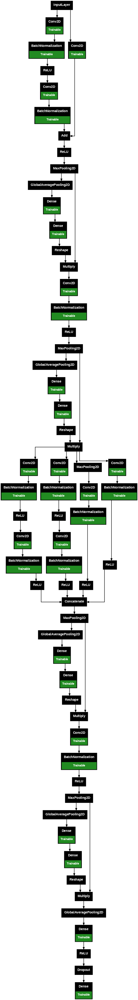

In [ ]:
# Build the model with specified input and output shapes
model = build_model()
#model = build_model(input_shape=input_shape, output_shape=output_shape, learning_rate=learning_rate)

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True,  dpi=70)

In [ ]:

# Compile the model
#loss=focal_loss(gamma=0.7, alpha=0.75)
loss = tfk.losses.CategoricalCrossentropy()
#loss=combined_loss()
optimizer = tfk.optimizers.AdamW(LEARNING_RATE)
#optimizer = tf.keras.optimizers.SGD(LEARNING_RATE, momentum=0.9)
metrics=[tf.keras.metrics.CategoricalAccuracy()]
model.compile(loss=loss, optimizer=optimizer, metrics=metrics)


In [ ]:
### Setup callbacks

# early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_categorical_accuracy',
    mode='max',
    patience=25,
    restore_best_weights=True
)

# LR_schedule
LR_schedule = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    min_delta=1e-6)


In [ ]:
history = model.fit(
    x=X_train_full,
    y=y_train_full,  # Etichette di training (one-hot encoded)
    batch_size=8,
    epochs=1000,
    validation_data=(X_val_full, y_val_full),
    callbacks=[early_stopping, LR_schedule],
    class_weight=class_weights_nodule,
    verbose=1
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_categorical_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'CNN_'+str(final_val_accuracy)+'.keras'
model.save(model_filename)

Epoch 1/1000
228/228 ━━━━━━━━━━━━━━━━━━━━ 310s 1s/step - categorical_accuracy: 0.2092 - loss: 14.9950 - val_categorical_accuracy: 0.0768 - val_loss: 9.1411 - learning_rate: 1.0000e-04
Epoch 2/1000
228/228 ━━━━━━━━━━━━━━━━━━━━ 208s 911ms/step - categorical_accuracy: 0.2139 - loss: 7.9237 - val_categorical_accuracy: 0.1579 - val_loss: 5.3875 - learning_rate: 1.0000e-04
Epoch 3/1000
228/228 ━━━━━━━━━━━━━━━━━━━━ 207s 906ms/step - categorical_accuracy: 0.1739 - loss: 4.9732 - val_categorical_accuracy: 0.1096 - val_loss: 3.9939 - learning_rate: 1.0000e-04
Epoch 4/1000
228/228 ━━━━━━━━━━━━━━━━━━━━ 206s 904ms/step - categorical_accuracy: 0.1716 - loss: 3.8348 - val_categorical_accuracy: 0.1075 - val_loss: 3.3531 - learning_rate: 1.0000e-04
Epoch 5/1000
228/228 ━━━━━━━━━━━━━━━━━━━━ 206s 905ms/step - categorical_accuracy: 0.1971 - loss: 3.3340 - val_categorical_accuracy: 0.2061 - val_loss: 2.9768 - learning_rate: 1.0000e-04
Epoch 6/1000
228/228 ━━━━━━━━━━━━━━━━━━━━ 206s 902ms/step - categorical_

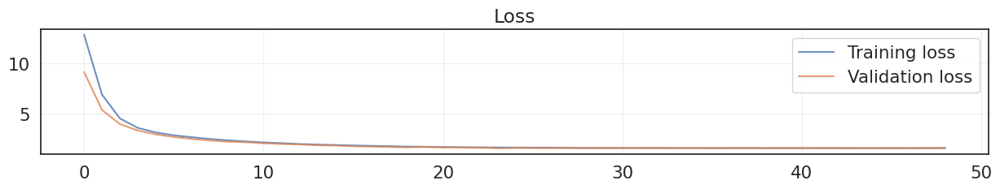

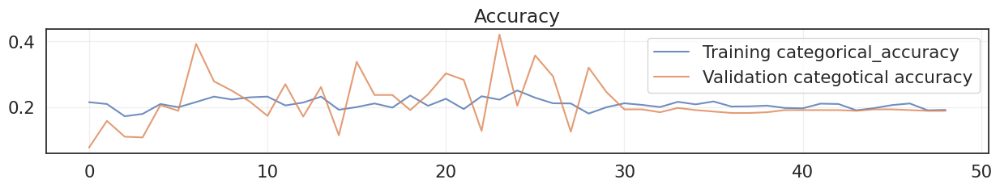

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['categorical_accuracy'], label='Training categorical_accuracy', alpha=.8)
plt.plot(history['val_categorical_accuracy'], label='Validation categotical accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
from tensorflow import keras as keras
# Build the model with specified input and output shapes
#model_nodule = keras.models.load_model(model_filename, compile=False) #, custom_objects={'SelfAttentionBlock': SelfAttentionBlock})
#model_full = keras.models.load_model('CNN_6.62.keras')
model_nodule=model
preds_nodule = model_nodule.predict(X_val_full, verbose=0)
print("Predictions Shape:", preds_nodule.shape)

pred_classes_nodule = np.argmax(preds_nodule, axis=1) # not in one-hot
pred_classes_nodule = pred_classes_nodule + 1

print(preds_nodule[0])
print(pred_classes_nodule[0])
print(y_val_nodule[0])

Predictions Shape: (456, 5)
[0.21447748 0.22024785 0.22687535 0.1985055  0.1398938 ]
3
[0. 1. 0. 0. 0.]


Accuracy score over the test set: 0.4211
Precision score over the test set: 0.2765
Recall score over the test set: 0.4211
F1 score over the test set: 0.2976


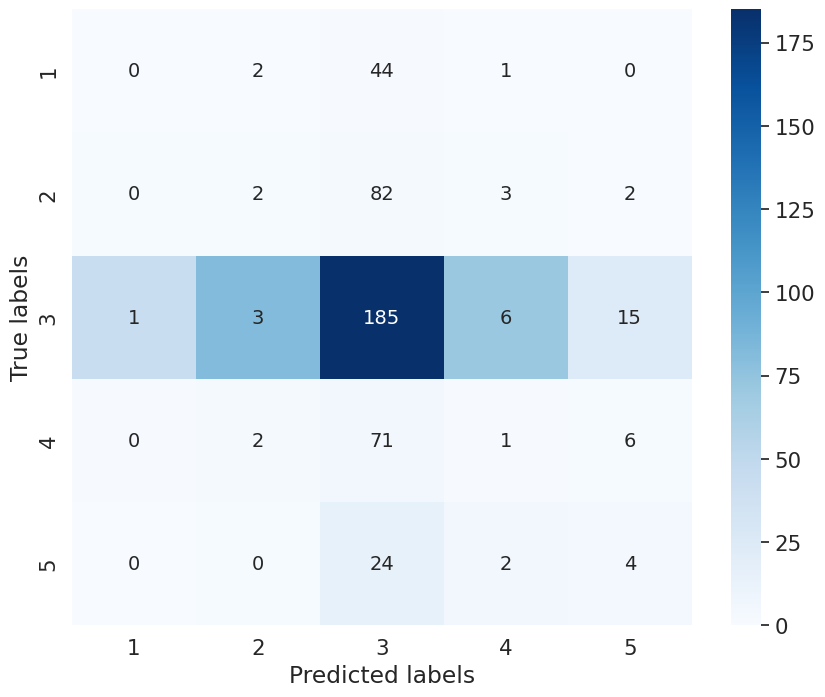

In [ ]:
# Extract ground truth classes
true_classes = np.argmax(y_val_nodule, axis=-1)
true_classes = true_classes + 1

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes_nodule)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes_nodule, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes_nodule)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

labels={1,2,3,4,5}
# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.show()

As we can see this model doesn't perform well and predicts only the class 3 (the majority one)

### 2.Autoencoder

Since the CNN did't give us good results we tried to train an autoencoder to help the model learn a compressed representation. The idea was then to mantain the encoder and replace the decoder with the classification head.

In [ ]:
def squeeze_excite_block(input_tensor, ratio=16):
    filters = input_tensor.shape[-1]

    # Global Average Pooling
    se = tfkl.GlobalAveragePooling2D()(input_tensor)
    se = tfkl.Reshape((1, 1, filters))(se)

    # Bottleneck for channel compression
    se = tfkl.Dense(filters // ratio, activation='relu')(se)

    # Re-expand and apply sigmoid to scale the channels
    se = tfkl.Dense(filters, activation='sigmoid')(se)

    # Scale the input tensor
    se = tfkl.Multiply()([input_tensor, se])

    return se

In [ ]:
def self_attention_block(input_tensor, filters, name='self_attention_'):
    # Convoluzione per ottenere Q, K, V (query, key, value)
    query = tfkl.Conv2D(filters, kernel_size=1, padding='same', name=name + 'query')(input_tensor)
    key = tfkl.Conv2D(filters, kernel_size=1, padding='same', name=name + 'key')(input_tensor)
    value = tfkl.Conv2D(filters, kernel_size=1, padding='same', name=name + 'value')(input_tensor)

    # Calcolo dell'attenzione
    attention_map = tf.keras.layers.Attention()([query, key])

    # Applicazione dell'attenzione
    attended_tensor = tfkl.Multiply()([value, attention_map])

    return attended_tensor

In [ ]:
def unet_block(input_tensor, filters, kernel_size=3, activation='relu', stack=2, name=''):

    # Initialise the input tensor
    x = input_tensor

    # Apply a sequence of Conv2D, Batch Normalisation, and Activation layers for the specified number of stacks
    for i in range(stack):  # we stack multiple time
        x = tfkl.Conv2D(filters, kernel_size=kernel_size, padding='same', name=name + 'conv' + str(i + 1))(x)
        x = tfkl.BatchNormalization(name=name + 'bn' + str(i + 1))(x)

        # Apply SE block after each convolution
        x = squeeze_excite_block(x)
        x = tfkl.Activation(activation, name=name + 'activation' + str(i + 1))(x)

    # Return the transformed tensor
    return x

In [ ]:
def residual_bridge(x, filters, kernel_size=3, activation='relu', dilation_rate=3, name='residual_bridge_'):

    # Primo livello di convoluzione con dilatazione
    conv1 = tfkl.Conv2D(filters, kernel_size=kernel_size, padding='same', name=name + 'conv1')(x)
    conv1 = tfkl.BatchNormalization(name=name + 'bn1')(conv1)
    conv1 = tfkl.Activation(activation, name=name + 'activation1')(conv1)

    # Secondo livello di convoluzione con dilatazione
    conv2 = tfkl.Conv2D(filters, kernel_size=kernel_size, padding='same', dilation_rate=dilation_rate, name=name + 'conv2')(conv1)
    conv2 = tfkl.BatchNormalization(name=name + 'bn2')(conv2)

    # Self-Attention
    attention_output = self_attention_block(conv2, filters)

    # Convoluzione 1x1 per adattare il numero di filtri di x a conv2
    x = tfkl.Conv2D(filters, kernel_size=1, padding='same', name=name + 'shortcut')(x)

    # Aggiunta della connessione residuale (somma con l'input)
    residual = tfkl.Add(name=name + 'add')([conv2, x])

    # SE Block per enfatizzare le feature importanti
    se_output = squeeze_excite_block(residual)

    # Attivazione finale
    output = tfkl.Activation(activation, name=name + 'activation2')(residual)

    return output

In [ ]:
def get_unet_model(input_shape=(512, 512, 1), seed=42):
    tf.random.set_seed(seed)
    input_layer = tfkl.Input(shape=input_shape, name='input_layer')
    #input_layer_resized = tfkl.Resizing(256, 256)(input_layer)
    input_layer = augmentation (input_layer)

    # Downsampling path
    down_block_0 = unet_block(input_layer, 32, name='down_block_0_')
    d0 = tfkl.MaxPooling2D()(down_block_0) #256

    down_block_1 = unet_block(d0, 64, name='down_block1_')
    d1 = tfkl.MaxPooling2D()(down_block_1) #128

    down_block_2 = unet_block(d1, 128, name='down_block2_')
    d2 = tfkl.MaxPooling2D()(down_block_2) #64

    down_block_3 = unet_block(d2, 256, name='down_block3_')
    d3 = tfkl.MaxPooling2D()(down_block_3) #32

    down_block_4 = unet_block(d3, 512, name='down_block4_')
    d4 = tfkl.MaxPooling2D()(down_block_4) #16

    # Bottleneck
    bottleneck = residual_bridge(d4, 1024, name='bottleneck')
    #bottleneck = atrous_spatial_pyramid_pooling(d4, filters=1024, regularizer=None)


    # Upsampling path
    u1 = tfkl.UpSampling2D()(bottleneck)
    u1 = tfkl.Conv2D(512, kernel_size=1, padding='same')(u1)
    u1 = tfkl.Concatenate()([u1, down_block_4])  # Concatenazione con il nuovo blocco di downsampling
    u1 = unet_block(u1, 512, name='up_block1_')

    u2 = tfkl.UpSampling2D()(u1)
    u2 = tfkl.Conv2D(256, kernel_size=1, padding='same')(u2)
    u2 = tfkl.Concatenate()([u2, down_block_3])
    u2 = unet_block(u2, 256, name='up_block2_')

    u3 = tfkl.UpSampling2D()(u2)
    u3 = tfkl.Conv2D(128, kernel_size=1, padding='same')(u3)
    u3 = tfkl.Concatenate()([u3, down_block_2])
    u3 = unet_block(u3, 128, name='up_block3_')

    u4 = tfkl.UpSampling2D()(u3)
    u4 = tfkl.Conv2D(64, kernel_size=1, padding='same')(u4)
    u4 = tfkl.Concatenate()([u4, down_block_1])
    u4 = unet_block(u4, 64, name='up_block4_')

    u5 = tfkl.UpSampling2D()(u4)
    u5 = tfkl.Conv2D(32, kernel_size=1, padding='same')(u5)
    u5 = tfkl.Concatenate()([u5, down_block_0])
    u5 = unet_block(u5, 32, name='up_block5_')

    # Output Layer
    output_layer = tfkl.Conv2D(1, (1, 1),  activation='sigmoid', name='last_conv')(u5)
    #output_layer = tfkl.Resizing(64, 128)(output_layer)
    model = tf.keras.Model(inputs=input_layer, outputs=output_layer, name='UNet')

    return model

In [ ]:
# Build the model with specified input and output shapes
model = get_unet_model()

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "UNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ keras_tensor_7CLONE    │ (None, 512, 512, 1)  │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ down_block_0_conv1     │ (None, 512, 512, 32) │          320 │ keras_tensor_7CLON… │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ down_block_0_bn1       │ (None, 512, 512, 32) │          128 │ down_block_0_conv1… │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ global_average_poolin… │ (None, 32)           │            0 │ down_block_0_bn1[1… │    -    │
│ (GlobalAveragePooling… │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ reshape (Reshape)      │ (None, 1, 1, 32)     │            0 │ global_average_poo… │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ dense (Dense)          │ (None, 1, 1, 2)      │           66 │ reshape[1][0]       │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ dense_1 (Dense)        │ (None, 1, 1, 32)     │           96 │ dense[1][0]         │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ multiply (Multiply)    │ (None, 512, 512, 32) │            0 │ down_block_0_bn1[1… │    -    │
│                        │                      │              │ dense_1[1][0]       │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ down_block_0_activati… │ (None, 512, 512, 32) │            0 │ multiply[1][0]      │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ down_block_0_conv2     │ (None, 512, 512, 32) │        9,248 │ down_block_0_activ… │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ down_block_0_bn2       │ (None, 512, 512, 32) │          128 │ down_block_0_conv2… │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ global_average_poolin… │ (None, 32)           │            0 │ down_block_0_bn2[1… │    -    │
│ (GlobalAveragePooling… │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ reshape_1 (Reshape)    │ (None, 1, 1, 32)     │            0 │ global_average_poo… │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ dense_2 (Dense)        │ (None, 1, 1, 2)      │           66 │ reshape_1[1][0]     │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ dense_3 (Dense)        │ (None, 1, 1, 32)     │           96 │ dense_2[1][0]       │    Y    │
├──────────────────────

 Total params: 29,727,001 (113.40 MB)

 Trainable params: 29,714,969 (113.35 MB)

 Non-trainable params: 12,032 (47.00 KB)

In [ ]:
# Loss function

def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def dice_loss(y_true, y_pred):
    smooth = 1e-6
    intersection = tf.reduce_sum(y_true * y_pred)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def combined_loss(y_true, y_pred):
    mse = tf.keras.losses.MeanSquaredError()(y_true, y_pred)
    ssim = ssim_loss(y_true, y_pred)
    dice=dice_loss(y_true, y_pred)
    return mse + dice


In [ ]:
model.compile(optimizer='adam',
              loss=combined_loss,
              metrics=['mse', dice_loss])

In [ ]:
from tensorflow.keras.callbacks import Callback

class ImageReconstructionCallback(Callback):
    def __init__(self, X_test_full, X_test_nodule, interval=5):
        super().__init__()
        self.X_test_full = X_test_full
        self.X_test_nodule = X_test_nodule
        self.interval = interval  # Intervallo di epoche per la visualizzazione

    def on_epoch_end(self, epoch, logs=None):
        # Visualizza solo ogni 'interval' epoche
        if (epoch + 1) % self.interval == 0:
            print(f"Visualizzazione delle immagini ricostruite alla epoca {epoch + 1}")
            plot_reconstructed_images(epoch, self.model, self.X_test_full, self.X_test_nodule)


In [ ]:
# Setup callbacks
from tensorflow.keras.callbacks import Callback

# early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', # posso cambiare uscita da monitorare
    mode='min',
    patience=PATIENCE,
    restore_best_weights=True
)

# LR_schedule
LR_schedule = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=7,
    min_delta=5e-5)

class ImageReconstructionCallback(Callback):
    def __init__(self, X_test_full, X_test_nodule, interval=5):
        super().__init__()
        self.X_test_full = X_test_full
        self.X_test_nodule = X_test_nodule
        self.interval = interval  # Intervallo di epoche per la visualizzazione

    def on_epoch_end(self, epoch, logs=None):
        # Visualizza solo ogni 'interval' epoche
        if (epoch + 1) % self.interval == 0:
            print(f"Visualizzazione delle immagini ricostruite alla epoca {epoch + 1}")
            plot_reconstructed_images(epoch, self.model, self.X_test_full, self.X_test_nodule)

image_reconstruction_callback = ImageReconstructionCallback(X_val_full, X_val_nodule, interval=10)

Epoch 1/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 407s 1s/step - dice_loss: 0.4067 - loss: 0.4378 - mse: 0.0310 - val_dice_loss: 0.5376 - val_loss: 0.5716 - val_mse: 0.0342 - learning_rate: 0.0010
Epoch 2/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 205s 902ms/step - dice_loss: 0.3593 - loss: 0.3904 - mse: 0.0312 - val_dice_loss: 0.3822 - val_loss: 0.3969 - val_mse: 0.0150 - learning_rate: 0.0010
Epoch 3/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 898ms/step - dice_loss: 0.3564 - loss: 0.3883 - mse: 0.0319 - val_dice_loss: 0.3486 - val_loss: 0.3854 - val_mse: 0.0371 - learning_rate: 0.0010
Epoch 4/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 898ms/step - dice_loss: 0.3556 - loss: 0.3876 - mse: 0.0320 - val_dice_loss: 0.4078 - val_loss: 0.4868 - val_mse: 0.0792 - learning_rate: 0.0010
Epoch 5/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 897ms/step - dice_loss: 0.3552 - loss: 0.3871 - mse: 0.0320 - val_dice_loss: 0.3429 - val_loss: 0.3832 - val_mse: 0.0406 - learning_rate: 0.0010
Epoch 6/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 203s 89

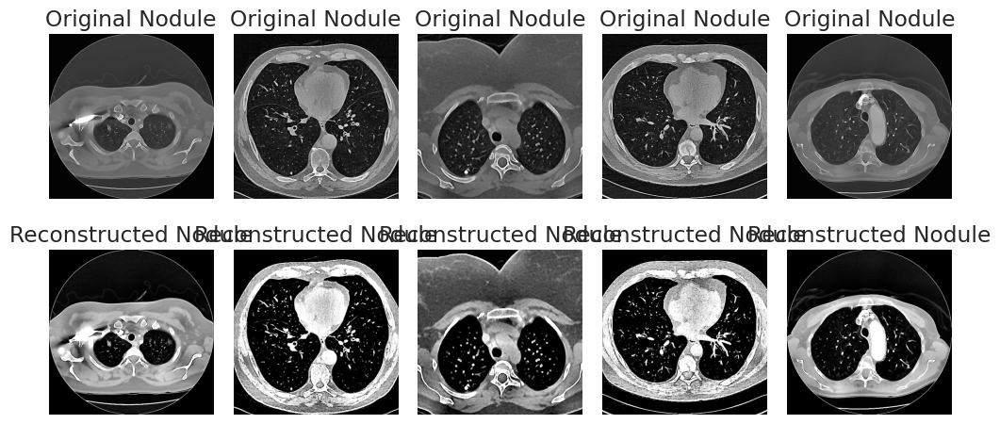

227/227 ━━━━━━━━━━━━━━━━━━━━ 288s 1s/step - dice_loss: 0.3547 - loss: 0.3867 - mse: 0.0321 - val_dice_loss: 0.3437 - val_loss: 0.3825 - val_mse: 0.0392 - learning_rate: 0.0010
Epoch 11/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 900ms/step - dice_loss: 0.3546 - loss: 0.3864 - mse: 0.0318 - val_dice_loss: 0.3448 - val_loss: 0.3822 - val_mse: 0.0377 - learning_rate: 0.0010
Epoch 12/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 897ms/step - dice_loss: 0.3546 - loss: 0.3864 - mse: 0.0318 - val_dice_loss: 0.3450 - val_loss: 0.3821 - val_mse: 0.0374 - learning_rate: 0.0010
Epoch 13/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 205s 901ms/step - dice_loss: 0.3545 - loss: 0.3864 - mse: 0.0318 - val_dice_loss: 0.3517 - val_loss: 0.3906 - val_mse: 0.0392 - learning_rate: 0.0010
Epoch 14/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 898ms/step - dice_loss: 0.3545 - loss: 0.3863 - mse: 0.0318 - val_dice_loss: 0.3459 - val_loss: 0.3818 - val_mse: 0.0362 - learning_rate: 0.0010
Epoch 15/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 203s 894ms/ste

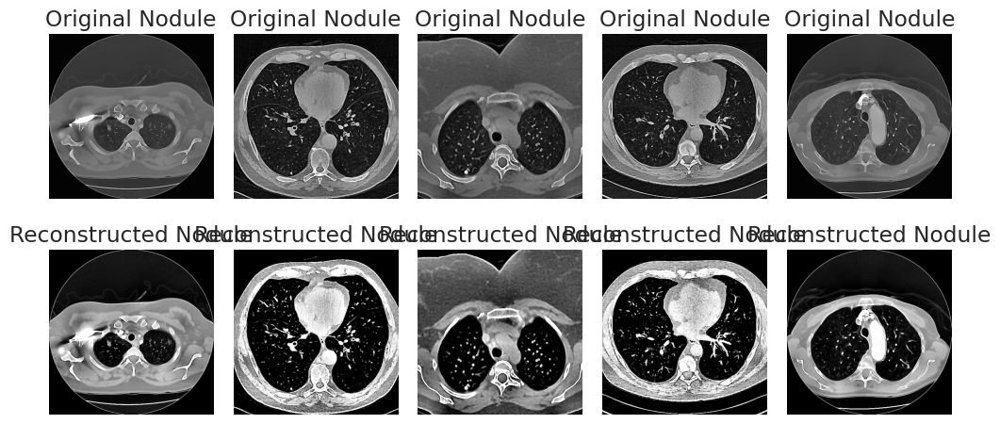

227/227 ━━━━━━━━━━━━━━━━━━━━ 221s 974ms/step - dice_loss: 0.3544 - loss: 0.3862 - mse: 0.0318 - val_dice_loss: 0.3592 - val_loss: 0.3953 - val_mse: 0.0364 - learning_rate: 0.0010
Epoch 21/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 899ms/step - dice_loss: 0.3544 - loss: 0.3862 - mse: 0.0318 - val_dice_loss: 0.3481 - val_loss: 0.3815 - val_mse: 0.0337 - learning_rate: 0.0010
Epoch 22/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 203s 895ms/step - dice_loss: 0.3544 - loss: 0.3862 - mse: 0.0317 - val_dice_loss: 0.3492 - val_loss: 0.3814 - val_mse: 0.0326 - learning_rate: 0.0010
Epoch 23/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 202s 891ms/step - dice_loss: 0.3544 - loss: 0.3861 - mse: 0.0318 - val_dice_loss: 0.3486 - val_loss: 0.3814 - val_mse: 0.0332 - learning_rate: 0.0010
Epoch 24/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 899ms/step - dice_loss: 0.3544 - loss: 0.3862 - mse: 0.0318 - val_dice_loss: 0.3483 - val_loss: 0.3814 - val_mse: 0.0335 - learning_rate: 0.0010
Epoch 25/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 203s 893ms/

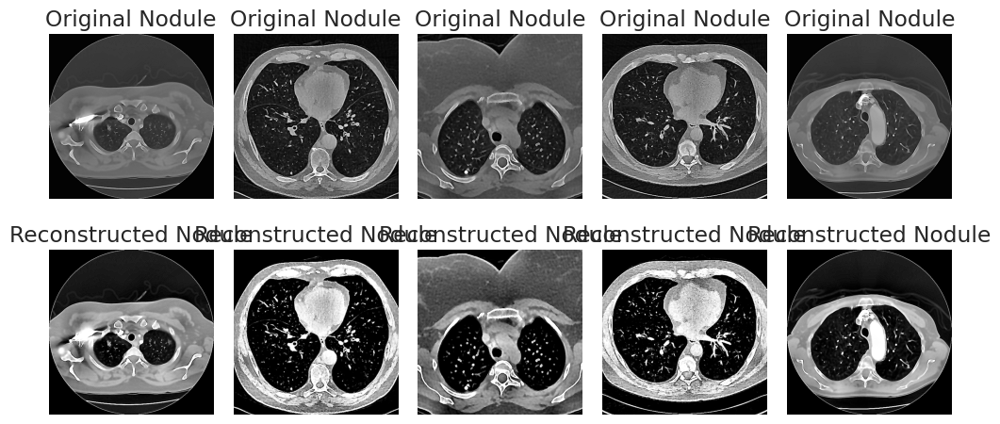

227/227 ━━━━━━━━━━━━━━━━━━━━ 220s 971ms/step - dice_loss: 0.3543 - loss: 0.3860 - mse: 0.0317 - val_dice_loss: 0.3486 - val_loss: 0.3814 - val_mse: 0.0332 - learning_rate: 1.0000e-04
Epoch 31/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 203s 893ms/step - dice_loss: 0.3543 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3489 - val_loss: 0.3814 - val_mse: 0.0328 - learning_rate: 1.0000e-04
Epoch 32/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 898ms/step - dice_loss: 0.3543 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3490 - val_loss: 0.3813 - val_mse: 0.0327 - learning_rate: 1.0000e-04
Epoch 33/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 202s 892ms/step - dice_loss: 0.3543 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3490 - val_loss: 0.3813 - val_mse: 0.0327 - learning_rate: 1.0000e-04
Epoch 34/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 898ms/step - dice_loss: 0.3543 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3489 - val_loss: 0.3813 - val_mse: 0.0328 - learning_rate: 1.0000e-04
Epoch 35/250
227/227 ━━━━━━━━━━━━

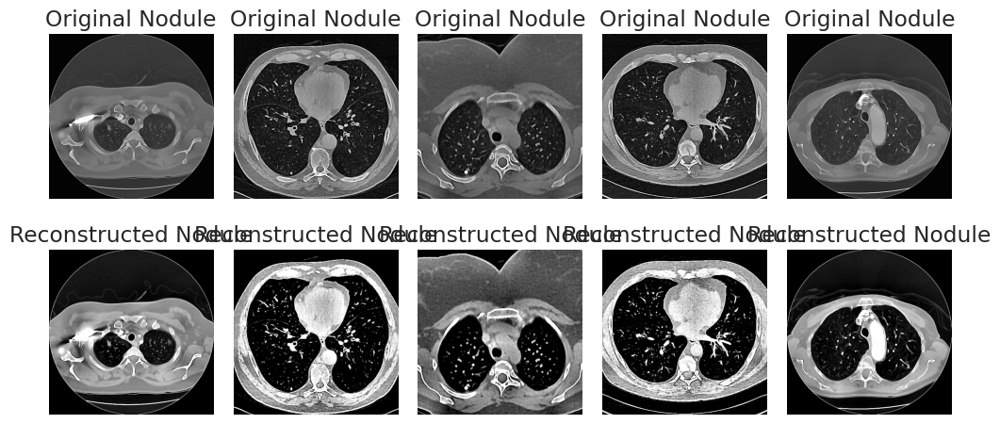

227/227 ━━━━━━━━━━━━━━━━━━━━ 221s 974ms/step - dice_loss: 0.3543 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3494 - val_loss: 0.3813 - val_mse: 0.0323 - learning_rate: 1.0000e-04
Epoch 41/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 203s 895ms/step - dice_loss: 0.3543 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3495 - val_loss: 0.3813 - val_mse: 0.0322 - learning_rate: 1.0000e-04
Epoch 42/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 203s 896ms/step - dice_loss: 0.3543 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3494 - val_loss: 0.3813 - val_mse: 0.0322 - learning_rate: 1.0000e-04
Epoch 43/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 898ms/step - dice_loss: 0.3544 - loss: 0.3859 - mse: 0.0315 - val_dice_loss: 0.3492 - val_loss: 0.3813 - val_mse: 0.0325 - learning_rate: 1.0000e-05
Epoch 44/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 897ms/step - dice_loss: 0.3542 - loss: 0.3859 - mse: 0.0316 - val_dice_loss: 0.3492 - val_loss: 0.3813 - val_mse: 0.0324 - learning_rate: 1.0000e-05
Epoch 45/250
227/227 ━━━━━━━━━━━━

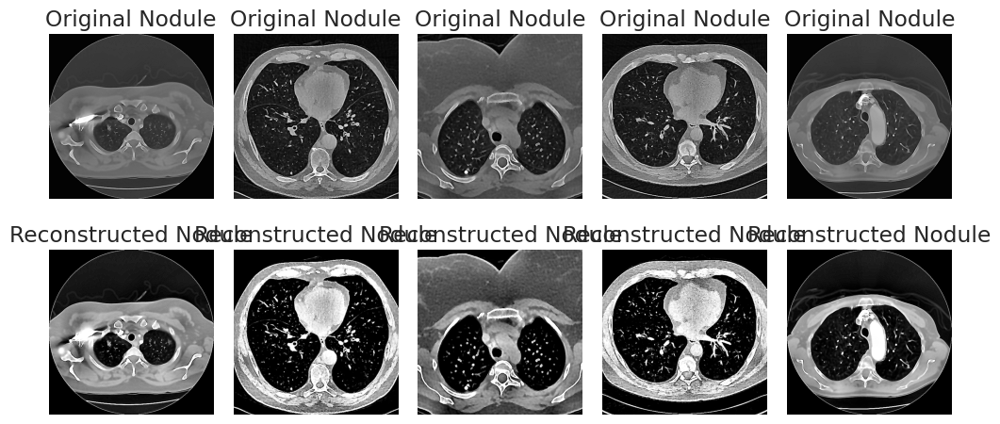

227/227 ━━━━━━━━━━━━━━━━━━━━ 221s 973ms/step - dice_loss: 0.3542 - loss: 0.3859 - mse: 0.0317 - val_dice_loss: 0.3492 - val_loss: 0.3813 - val_mse: 0.0325 - learning_rate: 1.0000e-06
Epoch 51/250
227/227 ━━━━━━━━━━━━━━━━━━━━ 204s 897ms/step - dice_loss: 0.3542 - loss: 0.3859 - mse: 0.0317 - val_dice_loss: 0.3492 - val_loss: 0.3813 - val_mse: 0.0325 - learning_rate: 1.0000e-06
Final validation loss: 0.3813


In [ ]:
history= model.fit(
    X_train_full,
    X_train_full, #X_train_nodule,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    validation_data=(X_val_full, X_val_full), #X_val_nodule),
    callbacks=[early_stopping, LR_schedule, image_reconstruction_callback],
    verbose=1
)

# Get the final validation loss (mean squared error)
final_val_loss = round(min(history.history['val_loss']), 4)

print(f'Final validation loss: {final_val_loss}')

# Save the trained model to a file with the loss included in the filename
model_filename = f'autoencoder_loss{final_val_loss}.keras'
model.save(model_filename)

In [ ]:
from tensorflow import keras as keras

# load the model and make predictions
model = keras.models.load_model('/content/drive/MyDrive/AI/Final_assignment/autoencoder_loss0.3813.keras', compile=False)
preds= model.predict(X_val_full, verbose=0)
print("Predictions Shape:", preds.shape)

Predictions Shape: (456, 512, 512, 1)


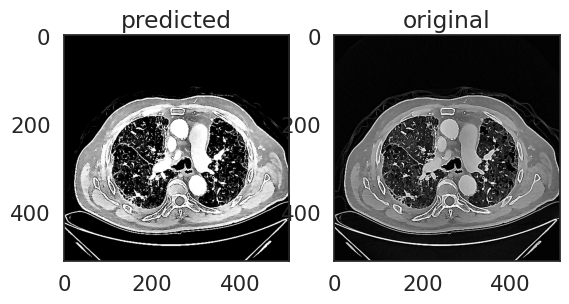

In [ ]:
# show
plt.subplot(1,2,1)
plt.imshow(preds[7], cmap='gray')
plt.title("predicted")

plt.subplot(1,2,2)
plt.imshow(X_val_full[7], cmap='gray')
plt.title("original")

plt.show()

In [ ]:
# take the encoder and extract the latent space
encoder = tfk.Model(inputs=model.input, outputs=model.get_layer('bottleneckactivation2').output)
latent_representations = encoder.predict(X_val_full)
latent_representations = latent_representations.reshape(latent_representations.shape[0], -1)

from sklearn.manifold import TSNE
# use t-SNE
tsne = TSNE(n_components=2)
latent_2d = tsne.fit_transform(latent_representations)

15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 455ms/step


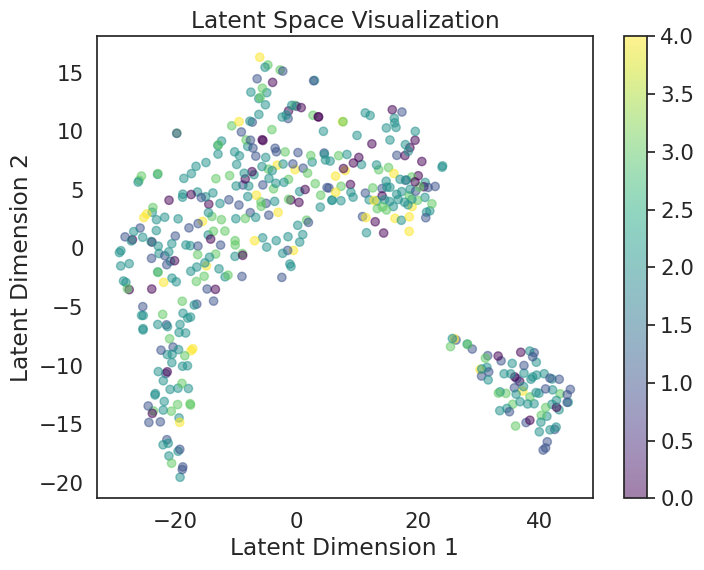

In [ ]:
# visualize the latent space

plt.figure(figsize=(8, 6))

plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=np.argmax(y_val_full, axis=-1), cmap='viridis', alpha=0.5)
plt.colorbar()  # add the color bar for the classes
plt.title('Latent Space Visualization')
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.show()

As we can see in the latent space there is no clear separation of the 5 classes. So the model has not understand useful information for the classification task and it is useless to change the decoder path with the classification head.

### 3.Transfer Learning

First train the model with all the pre-trained layers freezed

In [ ]:
from tensorflow.keras.applications import InceptionV3, ResNet50, DenseNet121, InceptionResNetV2
from tensorflow.keras import layers, models
import tensorflow as tf


seed=42
def build_model(
    input_shape=(256,256,3),
    output_shape=output_shape,
    augmentation=augmentation,
    seed=seed
):

    # Crea il base model senza la parte finale
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

    # Carica i pesi
    #base_model.load_weights('/kaggle/input/pretrained_densenet/keras/default/1/RadImageNet-DenseNet121_notop.h5')
    #base_model.load_weights('/kaggle/input/pretrained_resnet/keras/default/1/RadImageNet-ResNet50_notop.h5')
    #base_model.load_weights('/kaggle/input/pretrained_inceptionet/keras/default/1/RadImageNet-InceptionV3_notop.h5')
    #base_model.load_weights('/kaggle/input/pretrained_irv2/keras/default/1/RadImageNet-IRV2_notop.h5')
    #base_model.trainable = False
    base_model.trainable = False

    # Crea un input tensor
    inputs = layers.Input(shape=input_shape)
    # Applica l'augmentation
    #x = augmentation(inputs)


    # Propaga l'input attraverso il base model
    x = base_model(inputs)

    # Aggiungi strati finali
    x = layers.GlobalAveragePooling2D()(x)
    #x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    #x = layers.Dense(128, activation='relu')(x)
    #x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(5, activation='softmax', name='output_layer')(x)
    # create the model
    model = tfk.Model(inputs=inputs, outputs=outputs, name='RadimageNet')

    # Return the compiled model
    return model


In [ ]:
# Build the model with specified input and output shapes
model = build_model()

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True,  dpi=70)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "RadimageNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_2 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ inception_v3 (Functional)           │ (None, 6, 6, 2048)           │    21,802,784 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ input_layer_1 (InputLayer)     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d (Conv2D)                │ (None, 127, 127, 32)         │           864 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization            │ (None, 127, 127, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation (Activation)        │ (None, 127, 127, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_1 (Conv2D)              │ (None, 125, 125, 32)         │         9,216 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_1          │ (None, 125, 125, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_1 (Activation)      │ (None, 125, 125, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_2 (Conv2D)              │ (None, 125, 125, 64)         │        18,432 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_2          │ (None, 125, 125, 64)         │           192 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_2 (Activation)      │ (None, 125, 125, 64)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ max_pooling2d (MaxPooling2D)   │ (None, 62, 62, 64)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_3 (Conv2D)              │ (None, 62, 62, 80)           │         5,120 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_3          │ (None, 62, 62, 80)           │           240 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_3 (Activation)      │ (None, 62, 62, 80)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_4 (Conv2D)              │ (None, 60, 60, 192)          │       138,240 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalizat

 Total params: 21,813,029 (83.21 MB)

 Trainable params: 10,245 (40.02 KB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:

# Compile the model
LEARNING_RATE=1e-3
#loss=focal_loss(gamma=0.7, alpha=0.75)
loss = tfk.losses.CategoricalCrossentropy()
#loss=combined_loss()
optimizer = tfk.optimizers.AdamW(LEARNING_RATE)
#optimizer = tf.keras.optimizers.SGD(LEARNING_RATE, momentum=0.9)
metrics=[tf.keras.metrics.CategoricalAccuracy()]
model.compile(loss=loss, optimizer=optimizer, metrics=metrics)


In [ ]:
### Setup callbacks

# early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_categorical_accuracy',
    mode='max',
    patience=15,
    restore_best_weights=True
)

# LR_schedule
LR_schedule = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=10,
    min_delta=1e-6)


In [ ]:
history = model.fit(
    x=X_train_full,
    y=y_train_full,
    batch_size=8,
    epochs=250,
    validation_data=(X_val_full, y_val_full),
    callbacks=[early_stopping, LR_schedule],
    class_weight=class_weights_nodule,
    verbose=1
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_categorical_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'categorical_'+str(final_val_accuracy)+'.keras'
model.save(model_filename)

Epoch 1/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - categorical_accuracy: 0.1908 - loss: 2.1290 - val_categorical_accuracy: 0.2039 - val_loss: 1.7519 - learning_rate: 0.0010
Epoch 2/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - categorical_accuracy: 0.2310 - loss: 1.9011 - val_categorical_accuracy: 0.2719 - val_loss: 1.5545 - learning_rate: 0.0010
Epoch 3/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - categorical_accuracy: 0.2562 - loss: 1.7838 - val_categorical_accuracy: 0.2303 - val_loss: 1.6986 - learning_rate: 0.0010
Epoch 4/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - categorical_accuracy: 0.2889 - loss: 1.7126 - val_categorical_accuracy: 0.2171 - val_loss: 1.7169 - learning_rate: 0.0010
Epoch 5/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - categorical_accuracy: 0.3000 - loss: 1.7170 - val_categorical_accuracy: 0.2303 - val_loss: 1.6805 - learning_rate: 0.0010
Epoch 6/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - categorical_accuracy: 0.3019 - loss: 1.6450 - val_ca

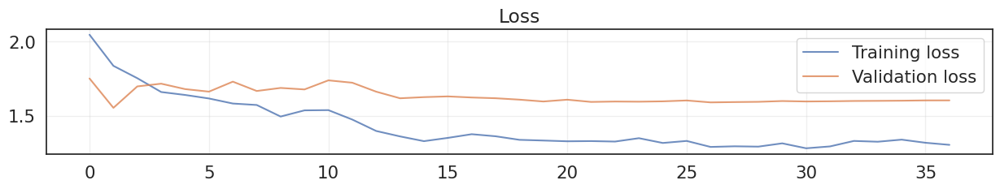

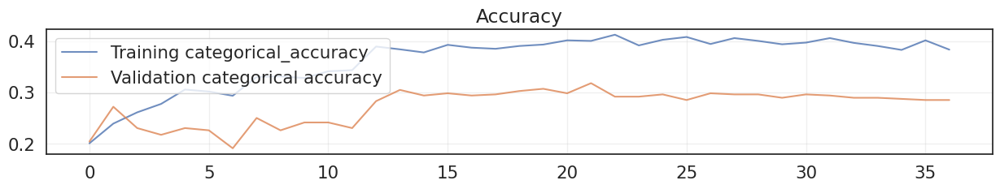

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['categorical_accuracy'], label='Training categorical_accuracy', alpha=.8)
plt.plot(history['val_categorical_accuracy'], label='Validation categorical accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
from tensorflow import keras as keras
# Build the model with specified input and output shapes
model_nodule=model
preds_nodule = model_nodule.predict(X_val_full, verbose=0)
print("Predictions Shape:", preds_nodule.shape)

pred_classes_nodule = (preds_nodule >= 0.5).astype(int)
pred_classes_nodule = np.argmax(preds_nodule, axis=1)
pred_classes_nodule = pred_classes_nodule + 1

print(preds_nodule[0])
print(pred_classes_nodule[0])
print(y_val_nodule[0])

Predictions Shape: (456, 5)
[0.20447147 0.25773415 0.19409132 0.23548107 0.10822199]
2
[0. 1. 0. 0. 0.]


Accuracy score over the test set: 0.318
Precision score over the test set: 0.3606
Recall score over the test set: 0.318
F1 score over the test set: 0.3303


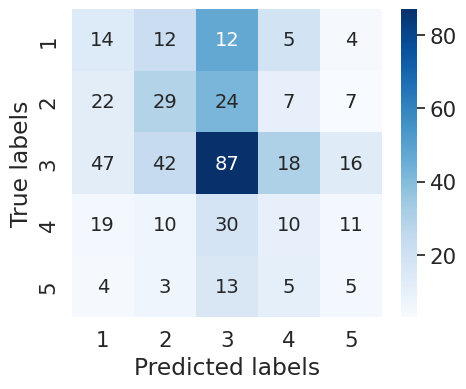

In [ ]:
# Extract ground truth classes
true_classes = np.argmax(y_val_nodule, axis=-1)
true_classes = true_classes + 1
#true_classes = y_val_full_bin

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes_nodule)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes_nodule, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes_nodule)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

labels={1,2,3,4,5}
# Plot the confusion matrix
plt.figure(figsize=(5, 4))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.show()

Then, retrain the model with the some layers unfreezed

In [ ]:
from keras.layers import Dense
from keras.models import Model

model=keras.models.load_model(model_filename)
x = model.layers[-2].output  # Prendi l'output del penultimo layer
new_output_layer = Dense(5, activation='softmax', name='output_layer_5')(x)
model_new = Model(inputs=model.inputs, outputs=new_output_layer)

base_model = model.layers[1]  # Il modello base è il secondo layer nel modello

base_model.trainable = True  # Rendi il base_model trainabile
for layer in base_model.layers:
    if layer.name == 'conv2d_64':  # inceptionV3
        set_trainable = True
        if set_trainable:
            layer.trainable = True
        else:
            layer.trainable = False

# Verifica che ogni layer sia ora trainabile
model_new.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture per visualizzare tutti i layer e le loro proprietà
#tf.keras.utils.plot_model(model_new, expand_nested=True)# show_trainable=True, dpi=70)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_2 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ inception_v3 (Functional)           │ (None, 6, 6, 2048)           │    21,802,784 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ input_layer_1 (InputLayer)     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d (Conv2D)                │ (None, 127, 127, 32)         │           864 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization            │ (None, 127, 127, 32)         │            96 │    Y    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation (Activation)        │ (None, 127, 127, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_1 (Conv2D)              │ (None, 125, 125, 32)         │         9,216 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_1          │ (None, 125, 125, 32)         │            96 │    Y    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_1 (Activation)      │ (None, 125, 125, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_2 (Conv2D)              │ (None, 125, 125, 64)         │        18,432 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_2          │ (None, 125, 125, 64)         │           192 │    Y    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_2 (Activation)      │ (None, 125, 125, 64)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ max_pooling2d (MaxPooling2D)   │ (None, 62, 62, 64)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_3 (Conv2D)              │ (None, 62, 62, 80)           │         5,120 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_3          │ (None, 62, 62, 80)           │           240 │    Y    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_3 (Activation)      │ (None, 62, 62, 80)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_4 (Conv2D)              │ (None, 60, 60, 192)          │       138,240 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalizat

 Total params: 21,813,029 (83.21 MB)

 Trainable params: 21,778,597 (83.08 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [ ]:
# Compile the model
LEARNING_RATE=1e-4
#loss=focal_loss(gamma=0.7, alpha=0.75)
loss = tfk.losses.CategoricalCrossentropy()
optimizer = tfk.optimizers.AdamW(LEARNING_RATE)
#optimizer = tf.keras.optimizers.SGD(LEARNING_RATE, momentum=0.9)
metrics=[tf.keras.metrics.CategoricalAccuracy()]
model_new.compile(loss=loss, optimizer=optimizer, metrics=metrics)


### Setup callbacks

# early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_categorical_accuracy',
    mode='max',
    patience=15,
    restore_best_weights=True
)

# LR_schedule
LR_schedule = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=10,
    min_delta=1e-6)


In [ ]:
history = model_new.fit(
    x=X_train_full,
    y=y_train_full,
    batch_size=8,
    epochs=250,
    validation_data=(X_val_full, y_val_full),
    callbacks=[early_stopping, LR_schedule],
    class_weight=class_weights_nodule,
    verbose=1
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_categorical_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = '5_classes_'+str(final_val_accuracy)+'.keras'
model_new.save(model_filename)

Epoch 1/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 148s 298ms/step - categorical_accuracy: 0.2085 - loss: 1.8272 - val_categorical_accuracy: 0.2346 - val_loss: 1.6020 - learning_rate: 1.0000e-04
Epoch 2/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - categorical_accuracy: 0.2924 - loss: 1.5050 - val_categorical_accuracy: 0.1952 - val_loss: 1.6942 - learning_rate: 1.0000e-04
Epoch 3/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - categorical_accuracy: 0.3559 - loss: 1.2713 - val_categorical_accuracy: 0.2039 - val_loss: 1.9281 - learning_rate: 1.0000e-04
Epoch 4/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - categorical_accuracy: 0.5265 - loss: 0.8818 - val_categorical_accuracy: 0.2259 - val_loss: 2.2791 - learning_rate: 1.0000e-04
Epoch 5/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - categorical_accuracy: 0.6796 - loss: 0.5789 - val_categorical_accuracy: 0.2895 - val_loss: 2.1106 - learning_rate: 1.0000e-04
Epoch 6/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - categorical_accuracy: 0.74

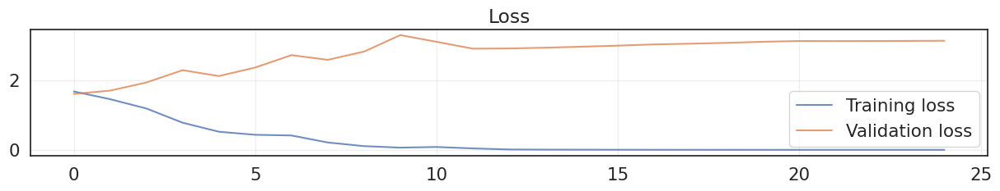

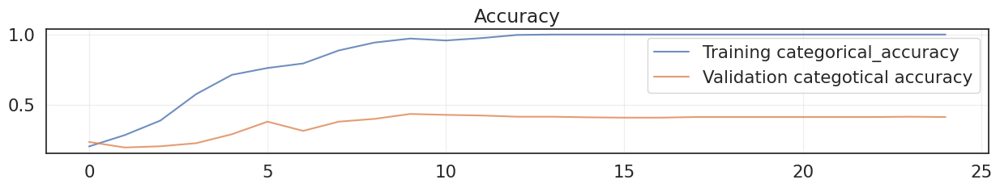

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['categorical_accuracy'], label='Training categorical_accuracy', alpha=.8)
plt.plot(history['val_categorical_accuracy'], label='Validation categotical accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
from tensorflow import keras as keras
# Build the model with specified input and output shapes
#model_nodule = keras.models.load_model(model_filename, compile=False) #, custom_objects={'SelfAttentionBlock': SelfAttentionBlock})
#model_full = keras.models.load_model('CNN_6.62.keras')
model_nodule=model_new
preds_nodule = model_nodule.predict(X_val_full, verbose=0)
print("Predictions Shape:", preds_nodule.shape)

pred_classes_nodule = np.argmax(preds_nodule, axis=1) # not in one-hot
pred_classes_nodule = pred_classes_nodule + 1

print(preds_nodule[0])
print(pred_classes_nodule[0])
print(y_val_nodule[0])

Predictions Shape: (456, 5)
[1.6106121e-04 3.0115057e-06 7.8979605e-01 1.5330309e-01 5.6736704e-02]
3
[0. 1. 0. 0. 0.]


Accuracy score over the test set: 0.4342
Precision score over the test set: 0.3988
Recall score over the test set: 0.4342
F1 score over the test set: 0.3835


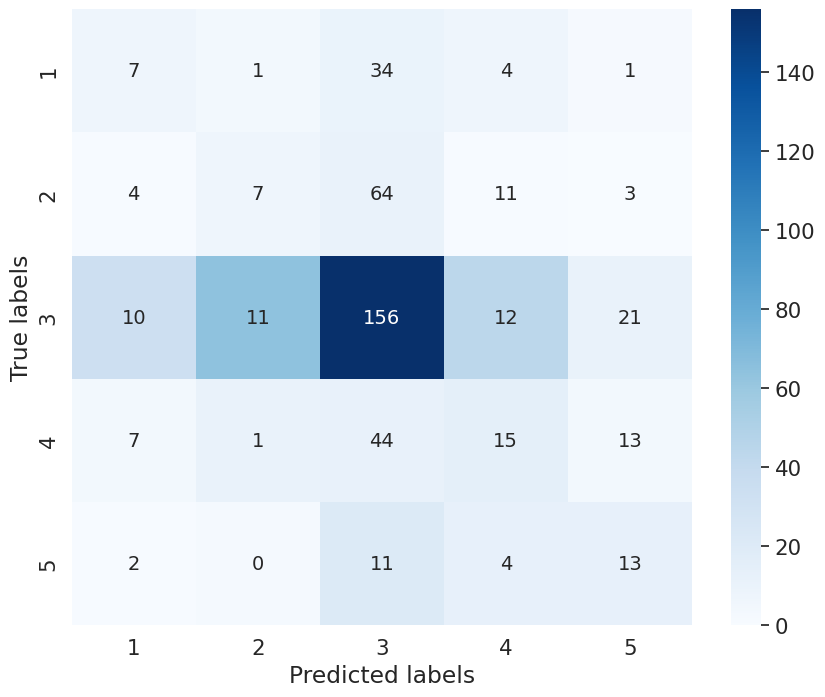

In [ ]:
true_classes = np.argmax(y_val_nodule, axis=-1)
true_classes = true_classes + 1

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes_nodule)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes_nodule, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes_nodule)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

labels={1,2,3,4,5}
# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.show()

### 4.RadImagenet

At the end, we tried to use models pretrained on RadImagenet, a radiomic dataset containing many CT, MRI and US images. This is done in order to exploit "specific domain" features.

#### 4.1 Binary

First we trained the binary model and then we fine-tuned over the 5 classes

In [ ]:
from tensorflow.keras.applications import InceptionV3, ResNet50, DenseNet121, InceptionResNetV2
from tensorflow.keras import layers, models
import tensorflow as tf

seed=42
def build_model(
    input_shape=(256,256,3),
    output_shape=output_shape,
    augmentation=augmentation,
    seed=seed
):

    # Crea il base model senza la parte finale
    base_model = InceptionResNetV2(weights=None, include_top=False, input_shape=input_shape)

    # Carica i pesi
    #base_model.load_weights('/kaggle/input/pretrained_densenet/keras/default/1/RadImageNet-DenseNet121_notop.h5')
    #base_model.load_weights('/kaggle/input/pretrained_resnet/keras/default/1/RadImageNet-ResNet50_notop.h5')
    #base_model.load_weights('/kaggle/input/pretrained_inceptionet/keras/default/1/RadImageNet-InceptionV3_notop.h5')
    base_model.load_weights('/kaggle/input/irv2/tensorflow2/default/1/RadImageNet-IRV2_notop.h5')
    #base_model.trainable = False
    base_model.trainable = True

    set_trainable = False
    for layer in base_model.layers:
        #if layer.name == 'conv3_block12_1_conv': #densenet121
        #if layer.name == 'conv4_block1_1_conv':  # resnet50
        #if layer.name == 'conv2d_64':  # inceptionV3
        if layer.name == 'conv2d_64':  # InceptionResNetV2
            set_trainable = True
        if set_trainable:
            if not isinstance(layer, layers.BatchNormalization):  # Evita il fine-tuning per BatchNorm
                    layer.trainable = True
        else:
            layer.trainable = False


    # Crea un input tensor
    inputs = layers.Input(shape=input_shape)
    # Applica l'augmentation
    x = augmentation(inputs)


    # Propaga l'input attraverso il base model
    x = base_model(inputs)

    # Aggiungi strati finali
    x = layers.GlobalAveragePooling2D()(x)
    #x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    #x = layers.Dense(128, activation='relu')(x)
    #x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(1, activation='sigmoid', name='output_layer')(x)
    # create the model
    model = tfk.Model(inputs=inputs, outputs=outputs, name='RadimageNet')

    # Return the compiled model
    return model


In [ ]:
# Build the model with specified input and output shapes
model = build_model()

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True,  dpi=70)

Model: "RadimageNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_2 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ inception_resnet_v2 (Functional)    │ (None, 6, 6, 1536)           │    54,336,736 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ input_layer_1 (InputLayer)     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d (Conv2D)                │ (None, 127, 127, 32)         │           864 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization            │ (None, 127, 127, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation (Activation)        │ (None, 127, 127, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_1 (Conv2D)              │ (None, 125, 125, 32)         │         9,216 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_1          │ (None, 125, 125, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_1 (Activation)      │ (None, 125, 125, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_2 (Conv2D)              │ (None, 125, 125, 64)         │        18,432 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_2          │ (None, 125, 125, 64)         │           192 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_2 (Activation)      │ (None, 125, 125, 64)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ max_pooling2d (MaxPooling2D)   │ (None, 62, 62, 64)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_3 (Conv2D)              │ (None, 62, 62, 80)           │         5,120 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_3          │ (None, 62, 62, 80)           │           240 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_3 (Activation)      │ (None, 62, 62, 80)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_4 (Conv2D)              │ (None, 60, 60, 192)          │       138,240 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalizat

 Total params: 54,338,273 (207.28 MB)

 Trainable params: 52,833,729 (201.54 MB)

 Non-trainable params: 1,504,544 (5.74 MB)

In [ ]:
# Compile the model
LEARNING_RATE=1e-3
#loss=focal_loss(gamma=0.7, alpha=0.75)
loss=tf.keras.losses.BinaryCrossentropy()
#loss=combined_loss()
optimizer = tfk.optimizers.AdamW(LEARNING_RATE)
#optimizer = tf.keras.optimizers.SGD(LEARNING_RATE, momentum=0.9)
metrics=[tf.keras.metrics.BinaryAccuracy()]
model.compile(loss=loss, optimizer=optimizer, metrics=metrics)


In [ ]:
### Setup callbacks

# early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_binary_accuracy',
    mode='max',
    patience=15,
    restore_best_weights=True
)

# LR_schedule
LR_schedule = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=10,
    min_delta=1e-6)


In [ ]:
history = model.fit(
    x=X_train_full,
    y=y_train_full_bin,
    batch_size=8,
    epochs=250,
    validation_data=(X_val_full, y_val_full_bin),
    callbacks=[early_stopping, LR_schedule],
    class_weight=weights_nodule_bin,
    verbose=1
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_binary_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'binary_'+str(final_val_accuracy)+'.keras'
model.save(model_filename)

Epoch 1/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 205s 405ms/step - binary_accuracy: 0.5613 - loss: 0.6962 - val_binary_accuracy: 0.7215 - val_loss: 0.6853 - learning_rate: 0.0010
Epoch 2/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - binary_accuracy: 0.7557 - loss: 0.5437 - val_binary_accuracy: 0.8158 - val_loss: 0.6626 - learning_rate: 0.0010
Epoch 3/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - binary_accuracy: 0.8680 - loss: 0.3485 - val_binary_accuracy: 0.8048 - val_loss: 0.7247 - learning_rate: 0.0010
Epoch 4/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - binary_accuracy: 0.8928 - loss: 0.3111 - val_binary_accuracy: 0.8070 - val_loss: 0.8771 - learning_rate: 0.0010
Epoch 5/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - binary_accuracy: 0.9357 - loss: 0.2062 - val_binary_accuracy: 0.8399 - val_loss: 0.6359 - learning_rate: 0.0010
Epoch 6/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - binary_accuracy: 0.9465 - loss: 0.1479 - val_binary_accuracy: 0.8246 - val_loss: 0.6160 - l

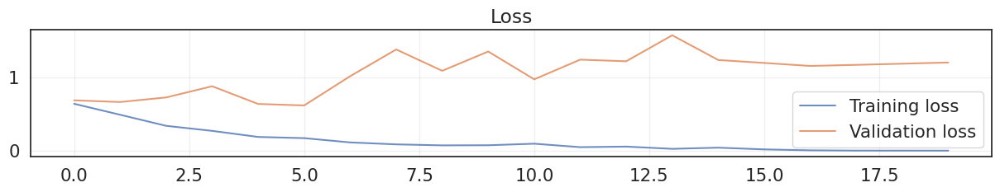

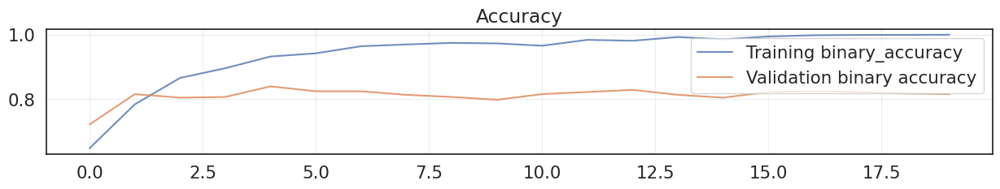

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['binary_accuracy'], label='Training binary_accuracy', alpha=.8)
plt.plot(history['val_binary_accuracy'], label='Validation binary accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
from tensorflow import keras as keras
# Build the model with specified input and output shapes
#model_nodule = keras.models.load_model(model_filename, compile=False) #, custom_objects={'SelfAttentionBlock': SelfAttentionBlock})
#model_full = keras.models.load_model('CNN_6.62.keras')
model_nodule=model
preds_nodule = model_nodule.predict(X_val_full, verbose=0)
print("Predictions Shape:", preds_nodule.shape)

pred_classes_nodule = (preds_nodule >= 0.5).astype(int)
#pred_classes_nodule = np.argmax(preds_nodule, axis=1) # not in one-hot
#pred_classes_nodule = pred_classes_nodule + 1

print(preds_nodule[0])
print(pred_classes_nodule[0])
print(y_val_nodule[0])

Predictions Shape: (456, 1)
[0.11101568]
[0]
[0. 1. 0. 0. 0.]


Accuracy score over the test set: 0.8399
Precision score over the test set: 0.8432
Recall score over the test set: 0.8399
F1 score over the test set: 0.8169


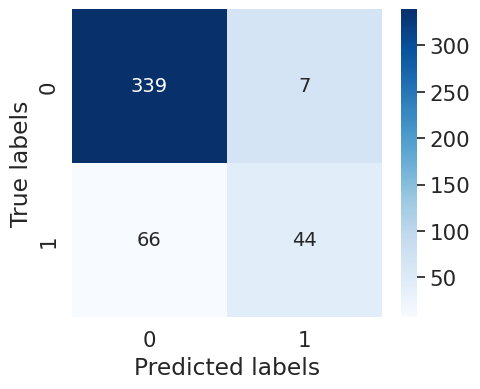

In [ ]:
# Extract ground truth classes
#true_classes = np.argmax(y_val_nodule, axis=-1)
#true_classes = true_classes + 1
true_classes = y_val_full_bin

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes_nodule)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes_nodule, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes_nodule)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

labels={1,2,3,4,5}
# Plot the confusion matrix
plt.figure(figsize=(5, 4))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=[0, 1], yticklabels=[0,1], cmap='Blues')
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.show()

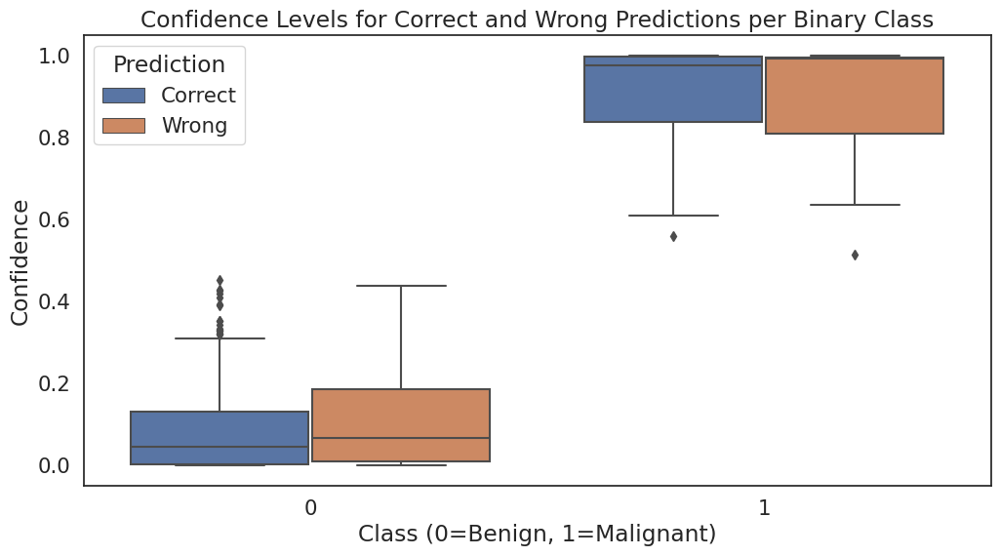

In [ ]:
boxplot_data = []

# Itera sulle due classi binarie: 0 (benigno) e 1 (maligno)
for class_label in [0, 1]:  # 0 per benigno, 1 per maligno
    # Trova gli indici dove la predizione è la classe attuale (class_label)
    class_indices = np.where(pred_classes_nodule == class_label)[0]

    # Per ogni predizione, ottieni la confidenza (probabilità della classe predetta)
    conf_class = preds[class_indices, 0]  # Poiché preds ha una sola colonna, prendi il primo (e unico) valore

    # Determina la classe predetta (0 o 1) basata sulla soglia 0.5
    predicted_class = (conf_class >= 0.5).astype(int)

    # Verifica se la predizione è corretta
    true_class = (predicted_class == true_classes[class_indices])

    # Dividi le confidenze in giuste (predicted_class == true_class) e sbagliate
    correct_conf = conf_class[true_class]
    wrong_conf = conf_class[~true_class]

    # Aggiungi i dati nel DataFrame
    for conf_data, label in zip([correct_conf, wrong_conf], ['Correct', 'Wrong']):
        if len(conf_data) > 0:  # Controlla che ci siano dati
            df = pd.DataFrame({
                'Confidence': conf_data,
                'Prediction': [label] * len(conf_data),
                'Class': [class_label] * len(conf_data)
            })
            boxplot_data.append(df)

# Concateniamo i dati in un unico DataFrame
plot_df = pd.concat(boxplot_data)

# Creiamo il boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Class', y='Confidence', hue='Prediction', data=plot_df)
plt.title('Confidence Levels for Correct and Wrong Predictions per Binary Class')
plt.ylabel('Confidence')
plt.xlabel('Class (0=Benign, 1=Malignant)')
plt.show()


# as we can see the confidence is better for the correct predictions.
# indeed, ideally the instances belonging to class 0 should have a 0 value as ouput of the sigmoid
# and, as opposite, the instances belonging to class 1 should have 1.
# So, if the output of the sigmoid is more nearer the 0.5 it means that the model is more uncertaint.

#### 4.2 5-classes

In [ ]:
from keras.layers import Dense
from keras.models import Model

model=keras.models.load_model(model_filename)
x = model.layers[-2].output  # Prendi l'output del penultimo layer
new_output_layer = Dense(5, activation='softmax', name='output_layer_5')(x)
model_new = Model(inputs=model.inputs, outputs=new_output_layer)


# Accedi al modello base (DenseNet121) dal modello globale
base_model = model.layers[1]  # Il modello base è il secondo layer nel modello

# Rendi il modello base e tutti i suoi layer trainabili
base_model.trainable = False  # Rendi il base_model trainabile

# Rendi ogni singolo layer trainabile, inclusi i layer del base_model
#for layer in base_model.layers:
#    layer.trainable = True

# Verifica che ogni layer sia ora trainabile
model_new.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture per visualizzare tutti i layer e le loro proprietà
#tf.keras.utils.plot_model(model_new, expand_nested=True)# show_trainable=True, dpi=70)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_2 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ inception_resnet_v2 (Functional)    │ (None, 6, 6, 1536)           │    54,336,736 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ input_layer_1 (InputLayer)     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d (Conv2D)                │ (None, 127, 127, 32)         │           864 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization            │ (None, 127, 127, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation (Activation)        │ (None, 127, 127, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_1 (Conv2D)              │ (None, 125, 125, 32)         │         9,216 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_1          │ (None, 125, 125, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_1 (Activation)      │ (None, 125, 125, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_2 (Conv2D)              │ (None, 125, 125, 64)         │        18,432 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_2          │ (None, 125, 125, 64)         │           192 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_2 (Activation)      │ (None, 125, 125, 64)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ max_pooling2d (MaxPooling2D)   │ (None, 62, 62, 64)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_3 (Conv2D)              │ (None, 62, 62, 80)           │         5,120 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_3          │ (None, 62, 62, 80)           │           240 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_3 (Activation)      │ (None, 62, 62, 80)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_4 (Conv2D)              │ (None, 60, 60, 192)          │       138,240 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalizat

 Total params: 54,344,421 (207.31 MB)

 Trainable params: 7,685 (30.02 KB)

 Non-trainable params: 54,336,736 (207.28 MB)

In [ ]:
# Compile the model
LEARNING_RATE=1e-4
#loss=focal_loss(gamma=0.7, alpha=0.75)
loss = tfk.losses.CategoricalCrossentropy()
optimizer = tfk.optimizers.AdamW(LEARNING_RATE)
#optimizer = tf.keras.optimizers.SGD(LEARNING_RATE, momentum=0.9)
metrics=[tf.keras.metrics.CategoricalAccuracy()]
model_new.compile(loss=loss, optimizer=optimizer, metrics=metrics)


### Setup callbacks

# early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_categorical_accuracy',
    mode='max',
    patience=15,
    restore_best_weights=True
)

# LR_schedule
LR_schedule = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=10,
    min_delta=1e-6)


In [ ]:
history = model_new.fit(
    x=X_train_full,
    y=y_train_full,  # Etichette di training (one-hot encoded)
    batch_size=8,
    epochs=250,
    validation_data=(X_val_full, y_val_full),
    callbacks=[early_stopping, LR_schedule],
    class_weight=class_weights_nodule,
    verbose=1
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_categorical_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = '5_classes_'+str(final_val_accuracy)+'.keras'
model_new.save(model_filename)

Epoch 1/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 54s 139ms/step - categorical_accuracy: 0.3227 - loss: 1.6627 - val_categorical_accuracy: 0.2325 - val_loss: 1.4512 - learning_rate: 1.0000e-04
Epoch 2/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - categorical_accuracy: 0.3145 - loss: 1.3545 - val_categorical_accuracy: 0.2412 - val_loss: 1.4376 - learning_rate: 1.0000e-04
Epoch 3/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step - categorical_accuracy: 0.3412 - loss: 1.2654 - val_categorical_accuracy: 0.2215 - val_loss: 1.4407 - learning_rate: 1.0000e-04
Epoch 4/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - categorical_accuracy: 0.3488 - loss: 1.2282 - val_categorical_accuracy: 0.2522 - val_loss: 1.4398 - learning_rate: 1.0000e-04
Epoch 5/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - categorical_accuracy: 0.3415 - loss: 1.1973 - val_categorical_accuracy: 0.2632 - val_loss: 1.4432 - learning_rate: 1.0000e-04
Epoch 6/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step - categorical_accuracy: 0.348

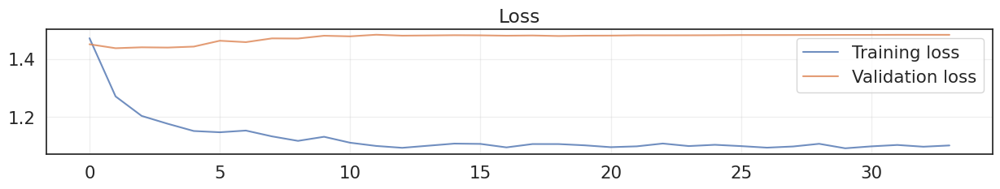

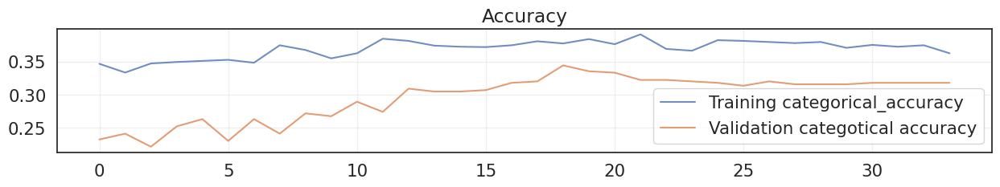

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['categorical_accuracy'], label='Training categorical_accuracy', alpha=.8)
plt.plot(history['val_categorical_accuracy'], label='Validation categotical accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
from tensorflow import keras as keras
# Build the model with specified input and output shapes
#model_nodule = keras.models.load_model(model_filename, compile=False) #, custom_objects={'SelfAttentionBlock': SelfAttentionBlock})
#model_full = keras.models.load_model('CNN_6.62.keras')
model_nodule=model_new
preds_nodule = model_nodule.predict(X_val_full, verbose=0)
print("Predictions Shape:", preds_nodule.shape)

pred_classes_nodule = np.argmax(preds_nodule, axis=1) # not in one-hot
pred_classes_nodule = pred_classes_nodule + 1

print(preds_nodule[0])
print(pred_classes_nodule[0])
print(y_val_nodule[0])

Predictions Shape: (456, 5)
[0.11891136 0.15529037 0.17641374 0.39576572 0.15361884]
4
[0. 1. 0. 0. 0.]


Accuracy score over the test set: 0.3443
Precision score over the test set: 0.4125
Recall score over the test set: 0.3443
F1 score over the test set: 0.3645


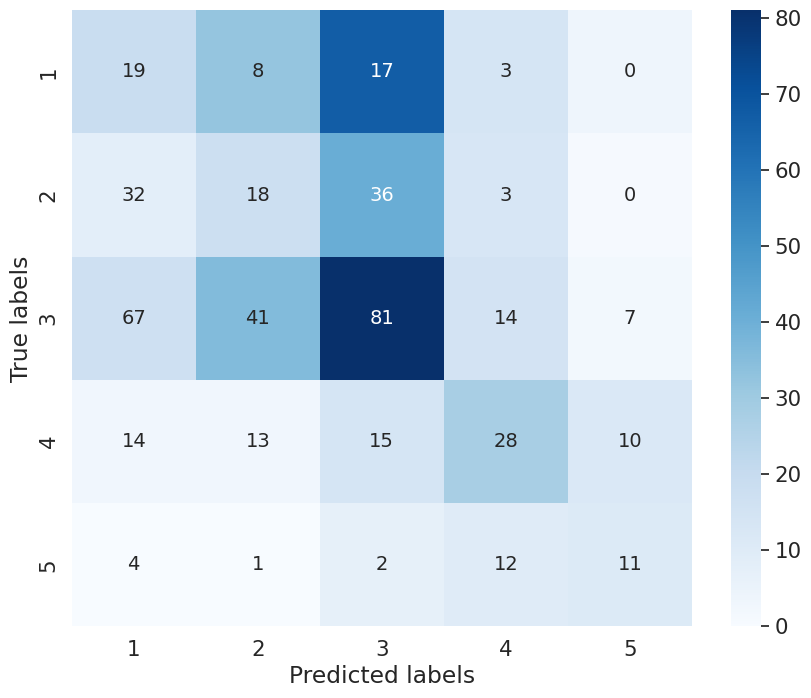

In [ ]:
true_classes = np.argmax(y_val_nodule, axis=-1)
true_classes = true_classes + 1

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes_nodule)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes_nodule, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes_nodule)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

labels={1,2,3,4,5}
# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.show()

In [ ]:
# Accedi al modello base (DenseNet121) dal modello globale
base_model = model_new.layers[1]  # Il modello base è il secondo layer nel modello

# Rendi il modello base e tutti i suoi layer trainabili
base_model.trainable = True  # Rendi il base_model trainabile

# Rendi il modello base e tutti i suoi layer trainabili
set_trainable = False
for layer in base_model.layers:
    if layer.name == 'conv2d_64':  # inceptionV3
        set_trainable = True
    if set_trainable:
        if not isinstance(layer, layers.BatchNormalization):  # Evita il fine-tuning per BatchNorm
                layer.trainable = True
    else:
        layer.trainable = False


# Verifica che ogni layer sia ora trainabile
model_new.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture per visualizzare tutti i layer e le loro proprietà
#tf.keras.utils.plot_model(model_new, expand_nested=True)# show_trainable=True, dpi=70)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_2 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ inception_resnet_v2 (Functional)    │ (None, 6, 6, 1536)           │    54,336,736 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ input_layer_1 (InputLayer)     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d (Conv2D)                │ (None, 127, 127, 32)         │           864 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization            │ (None, 127, 127, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation (Activation)        │ (None, 127, 127, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_1 (Conv2D)              │ (None, 125, 125, 32)         │         9,216 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_1          │ (None, 125, 125, 32)         │            96 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_1 (Activation)      │ (None, 125, 125, 32)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_2 (Conv2D)              │ (None, 125, 125, 64)         │        18,432 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_2          │ (None, 125, 125, 64)         │           192 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_2 (Activation)      │ (None, 125, 125, 64)         │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ max_pooling2d (MaxPooling2D)   │ (None, 62, 62, 64)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_3 (Conv2D)              │ (None, 62, 62, 80)           │         5,120 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalization_3          │ (None, 62, 62, 80)           │           240 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ activation_3 (Activation)      │ (None, 62, 62, 80)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ conv2d_4 (Conv2D)              │ (None, 60, 60, 192)          │       138,240 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ batch_normalizat

 Total params: 54,359,793 (207.37 MB)

 Trainable params: 52,839,877 (201.57 MB)

 Non-trainable params: 1,504,544 (5.74 MB)

 Optimizer params: 15,372 (60.05 KB)

In [ ]:
# Compile the model
LEARNING_RATE=1e-4
#loss=focal_loss(gamma=0.7, alpha=0.75)
loss = tfk.losses.CategoricalCrossentropy()  # !! SMOOTHING DIMINUISCE LA CONFIDENZA. PROVARE ANCHE SENZA
#loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1)   # smoothing to prevent overfitting due to MixUp e CutMix
#loss=combined_loss()
optimizer = tfk.optimizers.AdamW(LEARNING_RATE)
#optimizer = tf.keras.optimizers.SGD(LEARNING_RATE, momentum=0.9)
metrics=[tf.keras.metrics.CategoricalAccuracy()]
model_new.compile(loss=loss, optimizer=optimizer, metrics=metrics)


### Setup callbacks

# early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_categorical_accuracy',
    mode='max',
    patience=15,
    restore_best_weights=True
)

# LR_schedule
LR_schedule = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=10,
    min_delta=1e-6)


In [ ]:
history = model_new.fit(
    x=X_train_full,
    y=y_train_full,  # Etichette di training (one-hot encoded)
    batch_size=8,
    epochs=250,
    validation_data=(X_val_full, y_val_full),
    callbacks=[early_stopping, LR_schedule],
    class_weight=class_weights_nodule,
    verbose=1
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_categorical_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = '5_classes_'+str(final_val_accuracy)+'.keras'
model_new.save(model_filename)

Epoch 1/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 198s 395ms/step - categorical_accuracy: 0.3512 - loss: 1.1351 - val_categorical_accuracy: 0.3180 - val_loss: 1.4705 - learning_rate: 1.0000e-04
Epoch 2/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - categorical_accuracy: 0.4485 - loss: 0.9772 - val_categorical_accuracy: 0.3158 - val_loss: 1.5068 - learning_rate: 1.0000e-04
Epoch 3/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - categorical_accuracy: 0.4707 - loss: 0.8996 - val_categorical_accuracy: 0.3684 - val_loss: 1.5240 - learning_rate: 1.0000e-04
Epoch 4/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - categorical_accuracy: 0.5902 - loss: 0.7745 - val_categorical_accuracy: 0.4211 - val_loss: 1.5061 - learning_rate: 1.0000e-04
Epoch 5/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - categorical_accuracy: 0.6968 - loss: 0.5559 - val_categorical_accuracy: 0.4145 - val_loss: 1.6279 - learning_rate: 1.0000e-04
Epoch 6/250
228/228 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - categorical_accuracy:

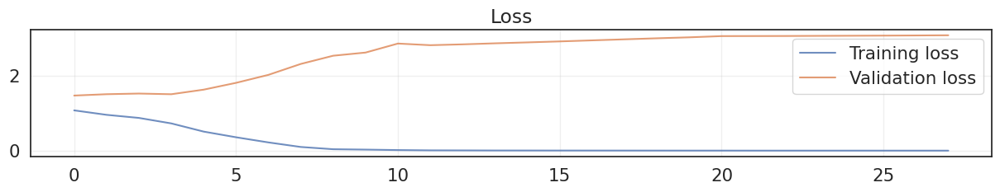

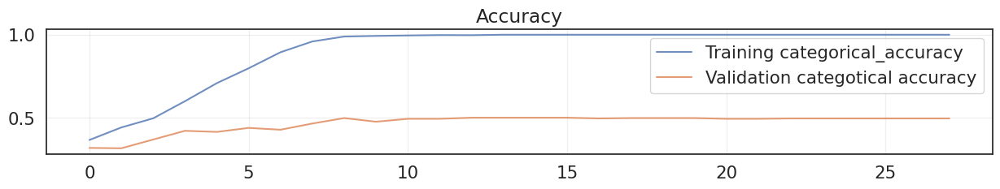

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['categorical_accuracy'], label='Training categorical_accuracy', alpha=.8)
plt.plot(history['val_categorical_accuracy'], label='Validation categotical accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
from tensorflow import keras as keras
# Build the model with specified input and output shapes
#model_nodule = keras.models.load_model(model_filename, compile=False) #, custom_objects={'SelfAttentionBlock': SelfAttentionBlock})
#model_full = keras.models.load_model('CNN_6.62.keras')
model_nodule=model_new
preds_nodule = model_nodule.predict(X_val_full, verbose=0)
print("Predictions Shape:", preds_nodule.shape)

pred_classes_nodule = np.argmax(preds_nodule, axis=1) # not in one-hot
pred_classes_nodule = pred_classes_nodule + 1

print(preds_nodule[0])
print(pred_classes_nodule[0])
print(y_val_nodule[0])

Predictions Shape: (456, 5)
[2.6930793e-05 2.0841598e-03 9.8642910e-01 1.1320925e-02 1.3891271e-04]
3
[0. 1. 0. 0. 0.]


Accuracy score over the test set: 0.5
Precision score over the test set: 0.4784
Recall score over the test set: 0.5
F1 score over the test set: 0.4734


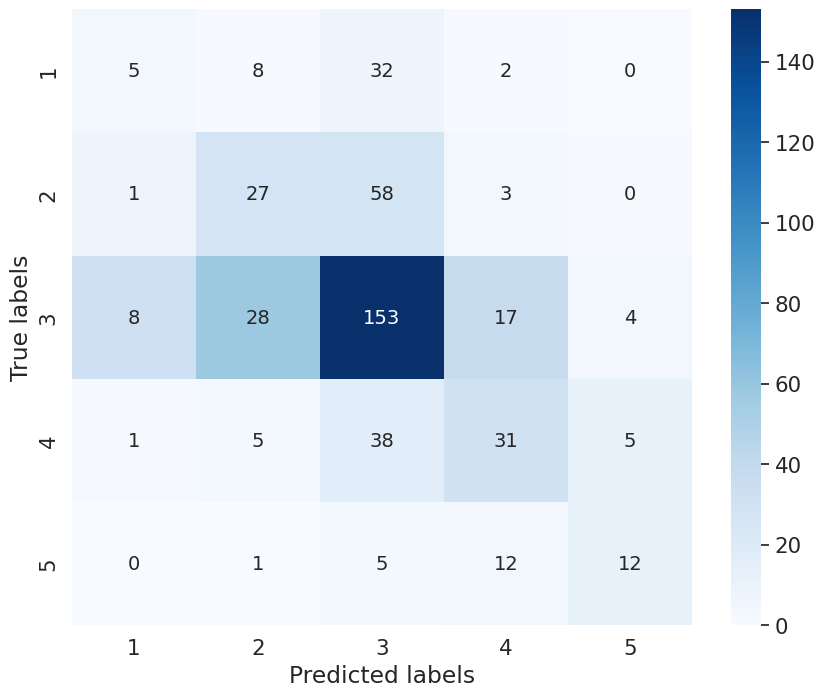

In [ ]:
true_classes = np.argmax(y_val_nodule, axis=-1)
true_classes = true_classes + 1

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes_nodule)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes_nodule, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes_nodule, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes_nodule)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

labels={1,2,3,4,5}
# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.show()

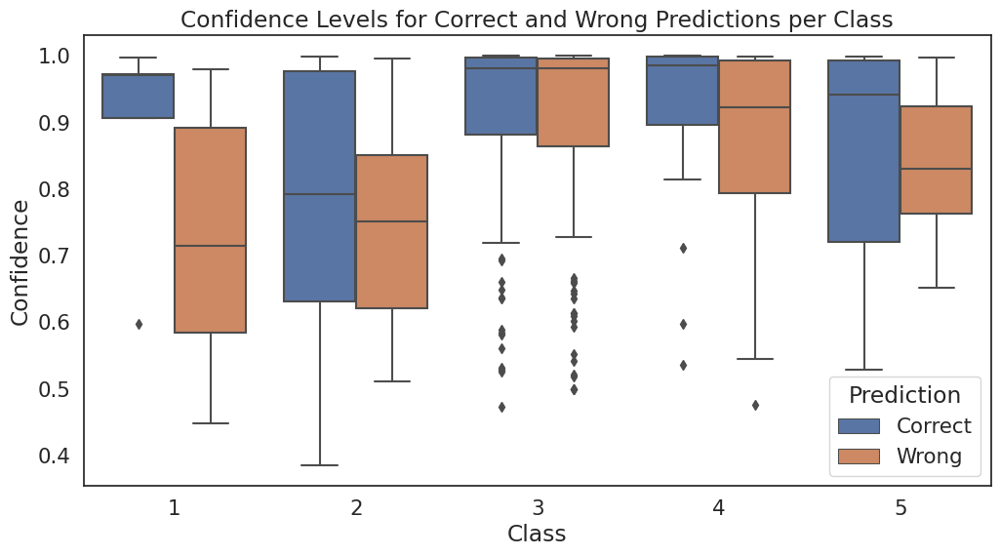

In [ ]:
boxplot_data = []
for class_label in range(1, 6):
    # Trova gli indici dove la predizione è la classe attuale (class_label)
    class_indices = np.where(pred_classes_nodule == class_label)[0]

    # Per ogni predizione, ottieni la confidenza (probabilità della classe predetta)
    conf_class = preds[class_indices, class_label - 1]

    # Dividi in giuste (y_pred == y_true) e sbagliate (y_pred != y_true)
    true_class = (pred_classes_nodule[class_indices] == true_classes[class_indices])

    # Salva i dati in un DataFrame per ciascuna classe e separa giuste/sbagliate
    for label, is_correct in zip(['Correct', 'Wrong'], [True, False]):
        conf_group = conf_class[true_class == is_correct]
        df = pd.DataFrame({
            'Confidence': conf_group,
            'Prediction': [label] * len(conf_group),
            'Class': [class_label] * len(conf_group)
        })
        boxplot_data.append(df)

# Concateniamo i dati in un unico DataFrame
plot_df = pd.concat(boxplot_data)

# Creiamo il boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Class', y='Confidence', hue='Prediction', data=plot_df)
plt.title('Confidence Levels for Correct and Wrong Predictions per Class')
plt.ylabel('Confidence')
plt.xlabel('Class')
plt.show()

# as we can see correct predictions have higher confidence